In [3]:
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
cmp='plasma'

In [ ]:
### FTCS Plot ###
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')

surf = ax.plot_surface(Tp, Xp, a1plot[:,0:iplot], rstride=1, cstride=1, 
                       cmap=cmp, edgecolor = 'black', linewidth = .5)
ax.set_xlabel('Time')
ax.set_ylabel('Position')
ax.set_zlabel('Amplitude')
ax.set_title('Advection of a wave with Dirichlet B.C.: FTCS method', fontsize = 20)
ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
        fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
ax.view_init(30, 205)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x,a1plot[:,0],'-',x,a1,'--');
plt.legend(['Initial  ','Final'])
ax.set_title('Waveforms: FTCS', fontsize = 20, y = .959)
ax.set_xlabel('x')
ax.set_ylabel('a(x,t)')
plt.tight_layout()
plt.show()


# Problem 1: 7.2
## FTCS, Lax, Lax-Wendroff methods
### Dirichlet: $[\text{sin}(\omega t), 0] \qquad \tau = .015$

Time for wave to move one grid spacing is  0.02
Wave circles system in  66.66666666666667  steps
Enter number of steps: 67


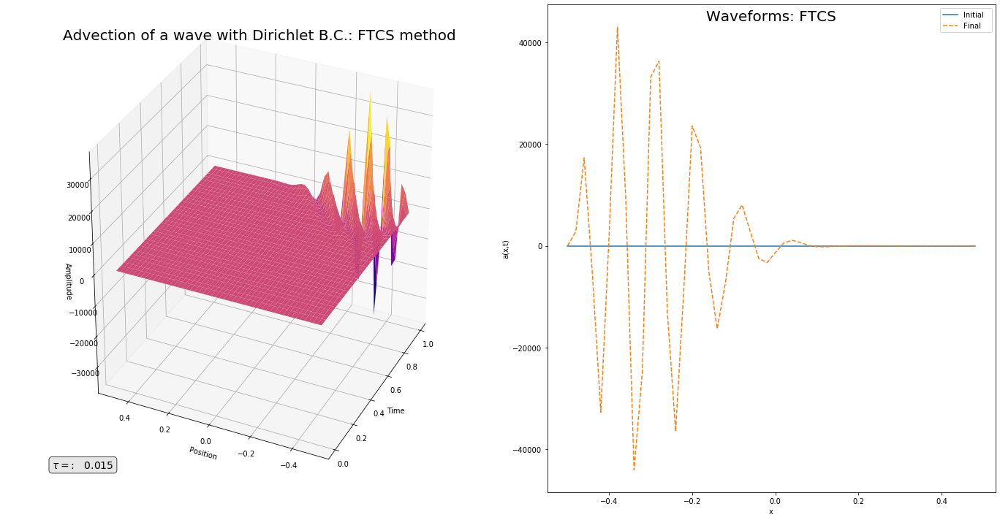

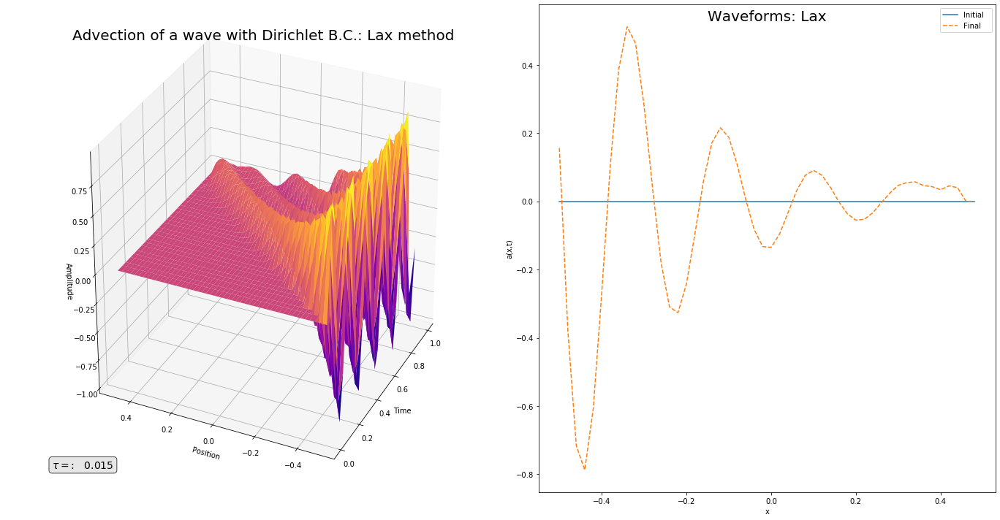

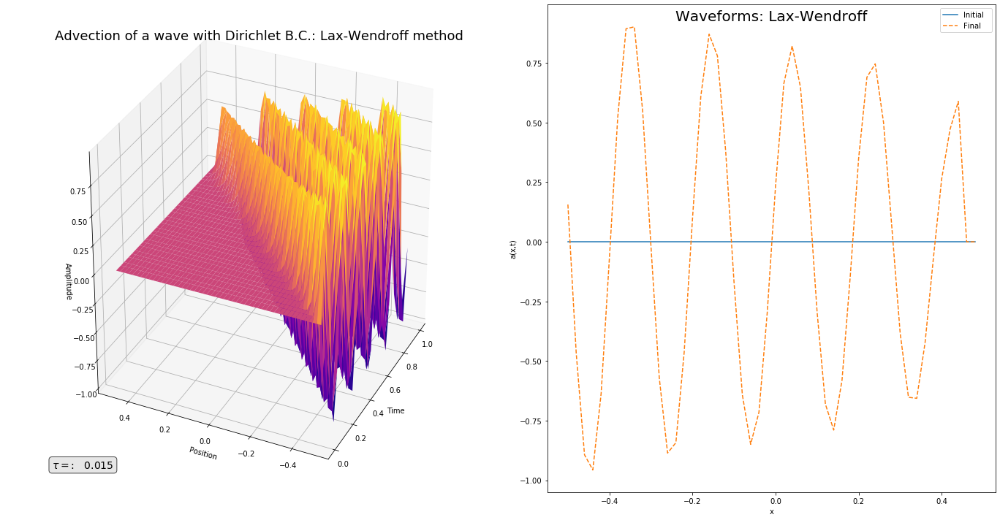

In [108]:
N = 50
tau = .015
w = np.pi * 10

L = 1.      # System size
h = L/N     # Grid spacing
c = 1.      # Wave speed
print('Time for wave to move one grid spacing is ', h/c)
coeff = c*tau/(2.*h)    # Coefficient used by all schemes
coefflw = 2*coeff**2     # Coefficient used by L-W scheme
print('Wave circles system in ', L/(c*tau), ' steps')
nStep = int(input('Enter number of steps: '))

# Set initial and boundary conditions: Dirichlet
sigma = 0.1                  # Width of the Gaussian pulse
k_wave = np.pi/sigma         # Wave number of the cosine
x = np.arange(N)*h - L/2.    # Coordinates of grid points

# Initial condition is zero
a1 = np.zeros(N)
a2 = np.zeros(N)
a3 = np.zeros(N)

#* Initialize plotting variables.
iplot = 1           # Plot counter
nplots = 50         # Desired number of plots
a1plot = np.empty((N,nplots))
a2plot = np.empty((N,nplots))
a3plot = np.empty((N,nplots))
tplot = np.empty(nplots)
a1plot[:,0] = np.copy(a1)     
a2plot[:,0] = np.copy(a2)     
a3plot[:,0] = np.copy(a3)     
tplot[0] = 0                # Record the initial time (t=0)
plotStep = nStep/nplots +1  # Number of steps between plots

for iStep in range(nStep):  ## MAIN LOOP ##
    ### FTCS method ###
    a1[1:N-2] = a1[1:N-2] - coeff*( a1[2:N-1] - a1[0:N-3] )
    a1[0] = np.sin(w*tau*(iStep+1))
    
    ### Lax method ###
    a2[1:N-2] = .5*( a2[2:N-1] + a2[0:N-3] ) - coeff*( a2[2:N-1] - a2[0:N-3] )   
    a2[0] = np.sin(w*tau*(iStep+1))
    
    ### Lax-Wendroff ###
    a3[1:N-2] = ( a3[1:N-2] - coeff*( a3[2:N-1] - a3[0:N-3] ) +
                 coefflw*( a3[2:N-1] + a3[0:N-3] - 2*a3[1:N-2] ) )    
    a3[0] = np.sin(w*tau*(iStep+1))

    # Periodically record a(t) for plotting.
    if (iStep+1) % plotStep < 1 :        # Every plot_iter steps record 
        a1plot[:,iplot] = np.copy(a1)
        a2plot[:,iplot] = np.copy(a2)
        a3plot[:,iplot] = np.copy(a3)
        tplot[iplot] = tau*(iStep+1)
        iplot += 1

Tp, Xp = np.meshgrid(tplot[0:iplot], x)

### FTCS Plot ###
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')

surf = ax.plot_surface(Tp, Xp, a1plot[:,0:iplot], rstride=1, cstride=1, 
                       cmap=cmp)
ax.set_xlabel('Time')
ax.set_ylabel('Position')
ax.set_zlabel('Amplitude')
ax.set_title('Advection of a wave with Dirichlet B.C.: FTCS method', fontsize = 20)
ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
        fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
ax.view_init(30, 205)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x,a1plot[:,0],'-',x,a1,'--');
plt.legend(['Initial  ','Final'])
ax.set_title('Waveforms: FTCS', fontsize = 20, y = .959)
ax.set_xlabel('x')
ax.set_ylabel('a(x,t)')
plt.tight_layout()
plt.show()

### Lax Plot ###
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')

surf = ax.plot_surface(Tp, Xp, a2plot[:,0:iplot], rstride=1, cstride=1, 
                       cmap=cmp)
ax.set_xlabel('Time')
ax.set_ylabel('Position')
ax.set_zlabel('Amplitude')
ax.set_title('Advection of a wave with Dirichlet B.C.: Lax method', fontsize = 20)
ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
        fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
ax.view_init(30, 205)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x,a2plot[:,0],'-',x,a2,'--');
plt.legend(['Initial  ','Final'])
ax.set_title('Waveforms: Lax', fontsize = 20, y = .959)
ax.set_xlabel('x')
ax.set_ylabel('a(x,t)')
plt.tight_layout()
plt.show()

### Lax-Wendroff Plot ###
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')

surf = ax.plot_surface(Tp, Xp, a3plot[:,0:iplot], rstride=1, cstride=1, 
                       cmap=cmp)
ax.set_xlabel('Time')
ax.set_ylabel('Position')
ax.set_zlabel('Amplitude')
ax.set_title('Advection of a wave with Dirichlet B.C.: Lax-Wendroff method', fontsize = 18)
ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
        fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
ax.view_init(30, 205)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x,a3plot[:,0],'-',x,a3,'--');
plt.legend(['Initial  ','Final'])
ax.set_title('Waveforms: Lax-Wendroff', fontsize = 20, y = .959)
ax.set_xlabel('x')
ax.set_ylabel('a(x,t)')
plt.tight_layout()
plt.show()

Time for wave to move one grid spacing is  0.002
Wave circles system in  666.6666666666666  steps
Enter number of steps: 667


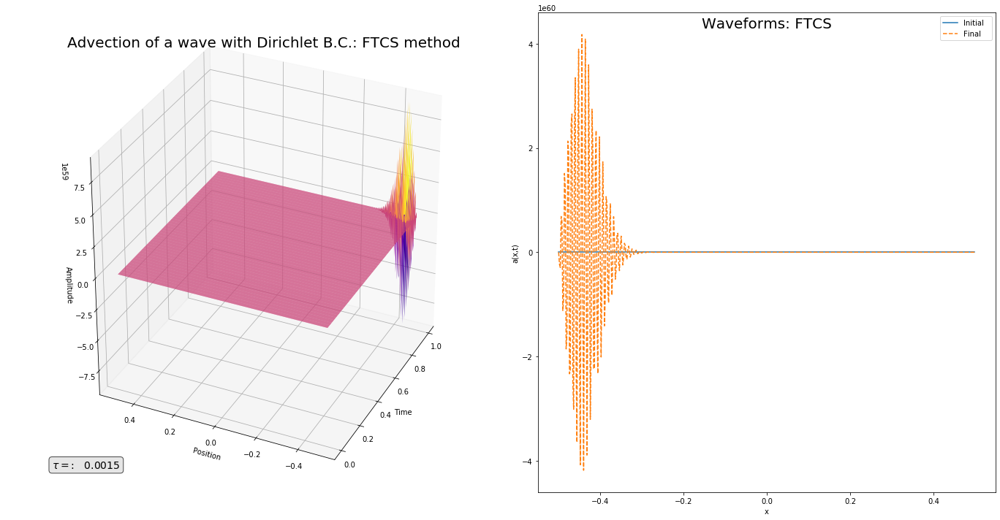

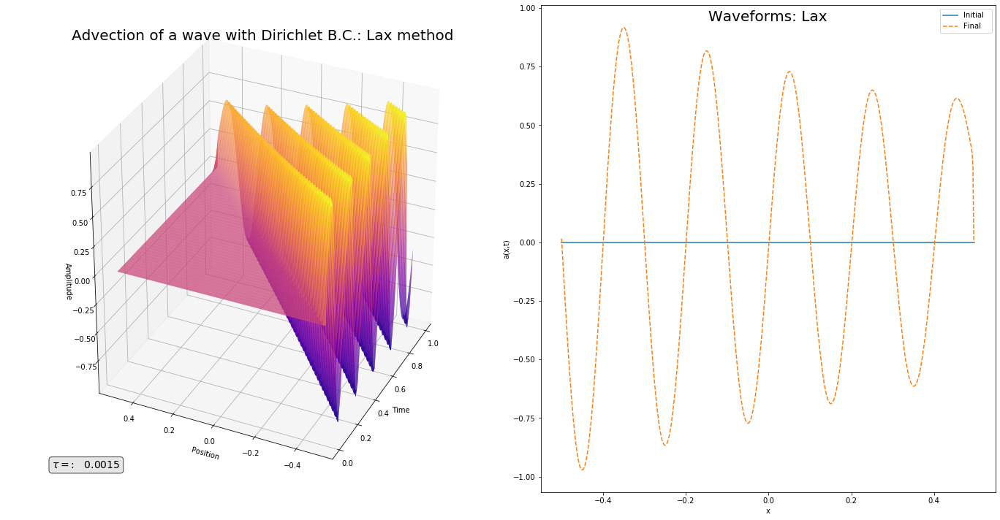

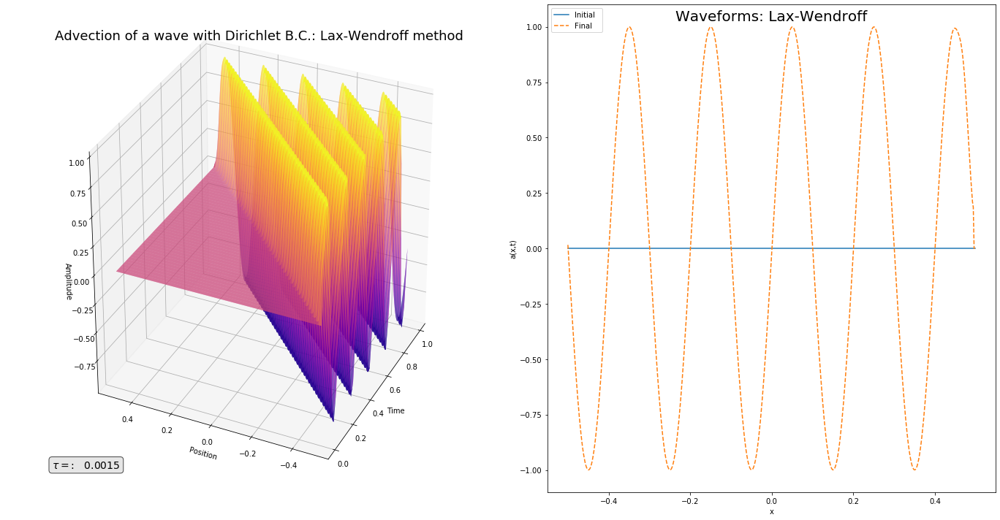

In [109]:
N = 500
tau = .0015
w = np.pi * 10

L = 1.      # System size
h = L/N     # Grid spacing
c = 1.      # Wave speed
print('Time for wave to move one grid spacing is ', h/c)
coeff = c*tau/(2.*h)    # Coefficient used by all schemes
coefflw = 2*coeff**2     # Coefficient used by L-W scheme
print('Wave circles system in ', L/(c*tau), ' steps')
nStep = int(input('Enter number of steps: '))

# Set initial and boundary conditions: Dirichlet
sigma = 0.1                  # Width of the Gaussian pulse
k_wave = np.pi/sigma         # Wave number of the cosine
x = np.arange(N)*h - L/2.    # Coordinates of grid points

# Initial condition is zero
a1 = np.zeros(N)
a2 = np.zeros(N)
a3 = np.zeros(N)

#* Initialize plotting variables.
iplot = 1           # Plot counter
nplots = 50         # Desired number of plots
a1plot = np.empty((N,nplots))
a2plot = np.empty((N,nplots))
a3plot = np.empty((N,nplots))
tplot = np.empty(nplots)
a1plot[:,0] = np.copy(a1)     
a2plot[:,0] = np.copy(a2)     
a3plot[:,0] = np.copy(a3)     
tplot[0] = 0                # Record the initial time (t=0)
plotStep = nStep/nplots +1  # Number of steps between plots

for iStep in range(nStep):  ## MAIN LOOP ##
    ### FTCS method ###
    a1[1:N-2] = a1[1:N-2] - coeff*( a1[2:N-1] - a1[0:N-3] )
    a1[0] = np.sin(w*tau*(iStep+1))
    
    ### Lax method ###
    a2[1:N-2] = .5*( a2[2:N-1] + a2[0:N-3] ) - coeff*( a2[2:N-1] - a2[0:N-3] )   
    a2[0] = np.sin(w*tau*(iStep+1))
    
    ### Lax-Wendroff ###
    a3[1:N-2] = ( a3[1:N-2] - coeff*( a3[2:N-1] - a3[0:N-3] ) +
                 coefflw*( a3[2:N-1] + a3[0:N-3] - 2*a3[1:N-2] ) )    
    a3[0] = np.sin(w*tau*(iStep+1))

    # Periodically record a(t) for plotting.
    if (iStep+1) % plotStep < 1 :        # Every plot_iter steps record 
        a1plot[:,iplot] = np.copy(a1)
        a2plot[:,iplot] = np.copy(a2)
        a3plot[:,iplot] = np.copy(a3)
        tplot[iplot] = tau*(iStep+1)
        iplot += 1

Tp, Xp = np.meshgrid(tplot[0:iplot], x)

### FTCS Plot ###
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')

surf = ax.plot_surface(Tp, Xp, a1plot[:,0:iplot], rstride=1, cstride=1, 
                       cmap=cmp)
ax.set_xlabel('Time')
ax.set_ylabel('Position')
ax.set_zlabel('Amplitude')
ax.set_title('Advection of a wave with Dirichlet B.C.: FTCS method', fontsize = 20)
ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
        fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
ax.view_init(30, 205)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x,a1plot[:,0],'-',x,a1,'--');
plt.legend(['Initial  ','Final'])
ax.set_title('Waveforms: FTCS', fontsize = 20, y = .959)
ax.set_xlabel('x')
ax.set_ylabel('a(x,t)')
plt.tight_layout()
plt.show()

### Lax Plot ###
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')

surf = ax.plot_surface(Tp, Xp, a2plot[:,0:iplot], rstride=1, cstride=1, 
                       cmap=cmp)
ax.set_xlabel('Time')
ax.set_ylabel('Position')
ax.set_zlabel('Amplitude')
ax.set_title('Advection of a wave with Dirichlet B.C.: Lax method', fontsize = 20)
ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
        fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
ax.view_init(30, 205)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x,a2plot[:,0],'-',x,a2,'--');
plt.legend(['Initial  ','Final'])
ax.set_title('Waveforms: Lax', fontsize = 20, y = .959)
ax.set_xlabel('x')
ax.set_ylabel('a(x,t)')
plt.tight_layout()
plt.show()

### Lax-Wendroff Plot ###
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')

surf = ax.plot_surface(Tp, Xp, a3plot[:,0:iplot], rstride=1, cstride=1, 
                       cmap=cmp)
ax.set_xlabel('Time')
ax.set_ylabel('Position')
ax.set_zlabel('Amplitude')
ax.set_title('Advection of a wave with Dirichlet B.C.: Lax-Wendroff method', fontsize = 18)
ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
        fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
ax.view_init(30, 205)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x,a3plot[:,0],'-',x,a3,'--');
plt.legend(['Initial  ','Final'])
ax.set_title('Waveforms: Lax-Wendroff', fontsize = 20, y = .959)
ax.set_xlabel('x')
ax.set_ylabel('a(x,t)')
plt.tight_layout()
plt.show()

# Problem 1: 7.2
## FTCS, Lax, Lax-Wendroff methods
### Dirichlet: $[\text{sin}(\omega t), 0] \qquad \tau = .02$

Time for wave to move one grid spacing is  0.02
Wave circles system in  50.0  steps
Enter number of steps: 50


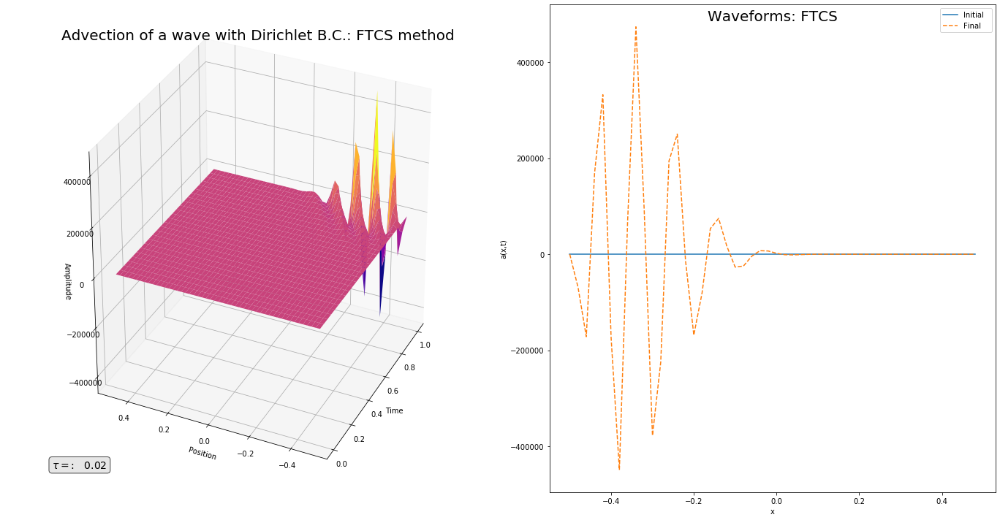

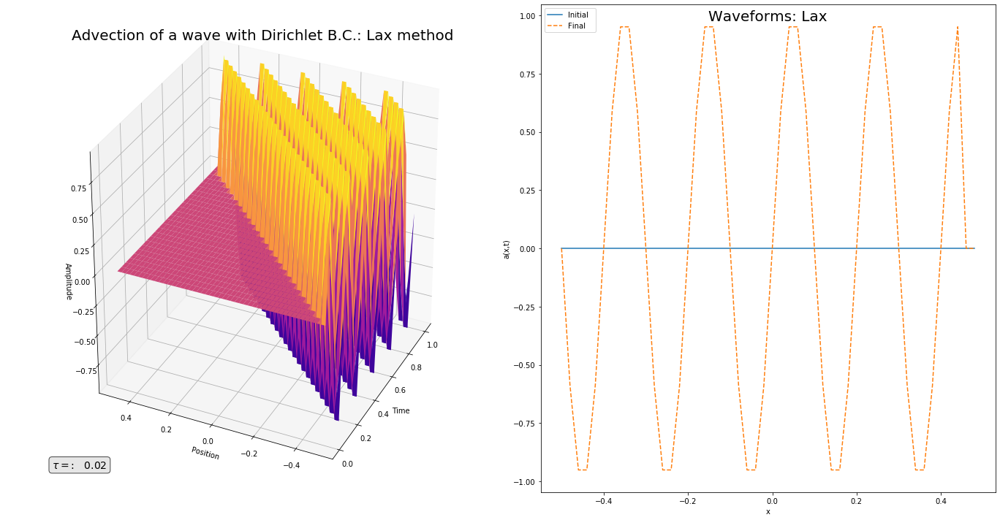

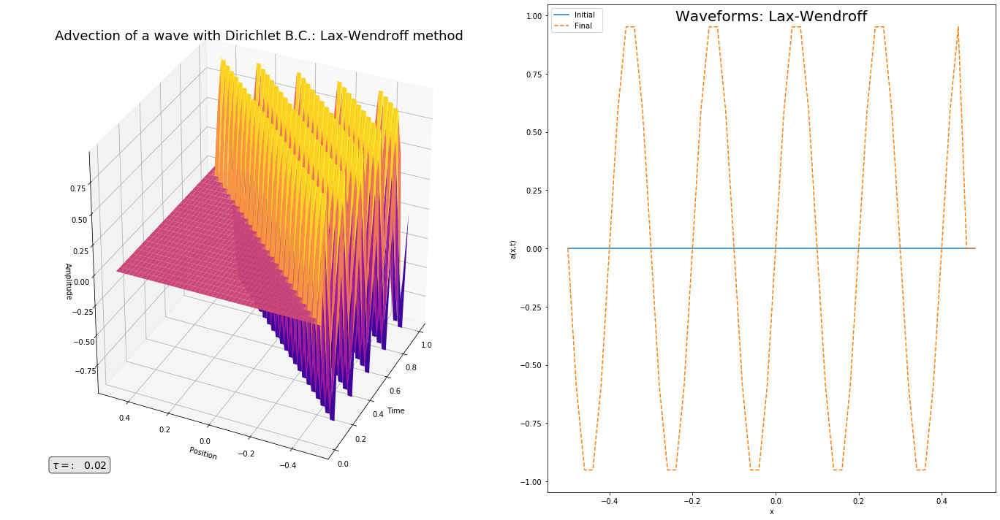

In [110]:
N = 50
tau = .02
w = np.pi * 10

L = 1.      # System size
h = L/N     # Grid spacing
c = 1.      # Wave speed
print('Time for wave to move one grid spacing is ', h/c)
coeff = c*tau/(2.*h)    # Coefficient used by all schemes
coefflw = 2*coeff**2     # Coefficient used by L-W scheme
print('Wave circles system in ', L/(c*tau), ' steps')
nStep = int(input('Enter number of steps: '))

# Set initial and boundary conditions: Dirichlet
sigma = 0.1                  # Width of the Gaussian pulse
k_wave = np.pi/sigma         # Wave number of the cosine
x = np.arange(N)*h - L/2.    # Coordinates of grid points

# Initial condition is zero
a1 = np.zeros(N)
a2 = np.zeros(N)
a3 = np.zeros(N)

#* Initialize plotting variables.
iplot = 1           # Plot counter
nplots = 50         # Desired number of plots
a1plot = np.empty((N,nplots))
a2plot = np.empty((N,nplots))
a3plot = np.empty((N,nplots))
tplot = np.empty(nplots)
a1plot[:,0] = np.copy(a1)     
a2plot[:,0] = np.copy(a2)     
a3plot[:,0] = np.copy(a3)     
tplot[0] = 0                # Record the initial time (t=0)
plotStep = nStep/nplots +1  # Number of steps between plots

for iStep in range(nStep):  ## MAIN LOOP ##
    ### FTCS method ###
    a1[1:N-2] = a1[1:N-2] - coeff*( a1[2:N-1] - a1[0:N-3] )
    a1[0] = np.sin(w*tau*(iStep+1))
    
    ### Lax method ###
    a2[1:N-2] = .5*( a2[2:N-1] + a2[0:N-3] ) - coeff*( a2[2:N-1] - a2[0:N-3] )   
    a2[0] = np.sin(w*tau*(iStep+1))
    
    ### Lax-Wendroff ###
    a3[1:N-2] = ( a3[1:N-2] - coeff*( a3[2:N-1] - a3[0:N-3] ) +
                 coefflw*( a3[2:N-1] + a3[0:N-3] - 2*a3[1:N-2] ) )    
    a3[0] = np.sin(w*tau*(iStep+1))

    # Periodically record a(t) for plotting.
    if (iStep+1) % plotStep < 1 :        # Every plot_iter steps record 
        a1plot[:,iplot] = np.copy(a1)
        a2plot[:,iplot] = np.copy(a2)
        a3plot[:,iplot] = np.copy(a3)
        tplot[iplot] = tau*(iStep+1)
        iplot += 1

Tp, Xp = np.meshgrid(tplot[0:iplot], x)

### FTCS Plot ###
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')

surf = ax.plot_surface(Tp, Xp, a1plot[:,0:iplot], rstride=1, cstride=1, 
                       cmap=cmp)
ax.set_xlabel('Time')
ax.set_ylabel('Position')
ax.set_zlabel('Amplitude')
ax.set_title('Advection of a wave with Dirichlet B.C.: FTCS method', fontsize = 20)
ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
        fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
ax.view_init(30, 205)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x,a1plot[:,0],'-',x,a1,'--');
plt.legend(['Initial  ','Final'])
ax.set_title('Waveforms: FTCS', fontsize = 20, y = .959)
ax.set_xlabel('x')
ax.set_ylabel('a(x,t)')
plt.tight_layout()
plt.show()

### Lax Plot ###
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')

surf = ax.plot_surface(Tp, Xp, a2plot[:,0:iplot], rstride=1, cstride=1, 
                       cmap=cmp)
ax.set_xlabel('Time')
ax.set_ylabel('Position')
ax.set_zlabel('Amplitude')
ax.set_title('Advection of a wave with Dirichlet B.C.: Lax method', fontsize = 20)
ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
        fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
ax.view_init(30, 205)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x,a2plot[:,0],'-',x,a2,'--');
plt.legend(['Initial  ','Final'])
ax.set_title('Waveforms: Lax', fontsize = 20, y = .959)
ax.set_xlabel('x')
ax.set_ylabel('a(x,t)')
plt.tight_layout()
plt.show()

### Lax-Wendroff Plot ###
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')

surf = ax.plot_surface(Tp, Xp, a3plot[:,0:iplot], rstride=1, cstride=1, 
                       cmap=cmp)
ax.set_xlabel('Time')
ax.set_ylabel('Position')
ax.set_zlabel('Amplitude')
ax.set_title('Advection of a wave with Dirichlet B.C.: Lax-Wendroff method', fontsize = 18)
ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
        fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
ax.view_init(30, 205)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x,a3plot[:,0],'-',x,a3,'--');
plt.legend(['Initial  ','Final'])
ax.set_title('Waveforms: Lax-Wendroff', fontsize = 20, y = .959)
ax.set_xlabel('x')
ax.set_ylabel('a(x,t)')
plt.tight_layout()
plt.show()

Time for wave to move one grid spacing is  0.002
Wave circles system in  500.0  steps
Enter number of steps: 500


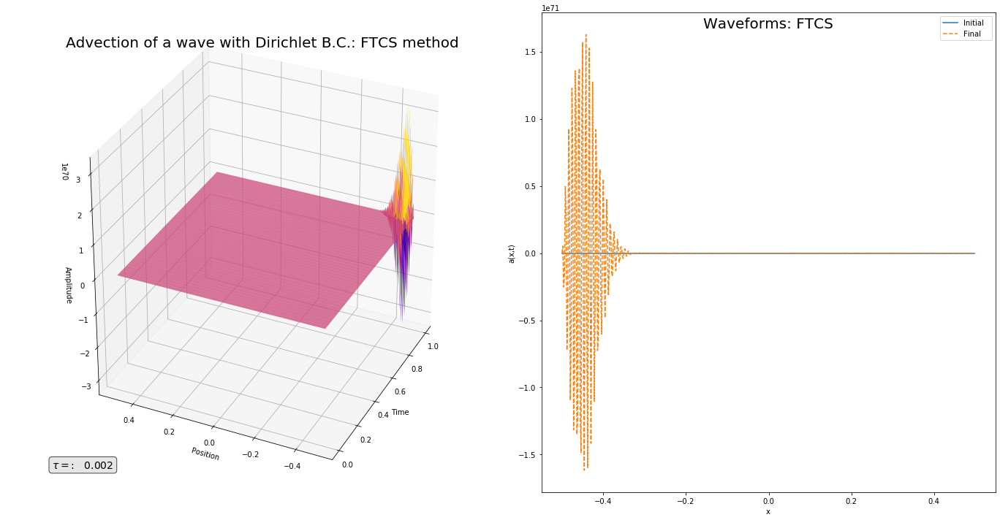

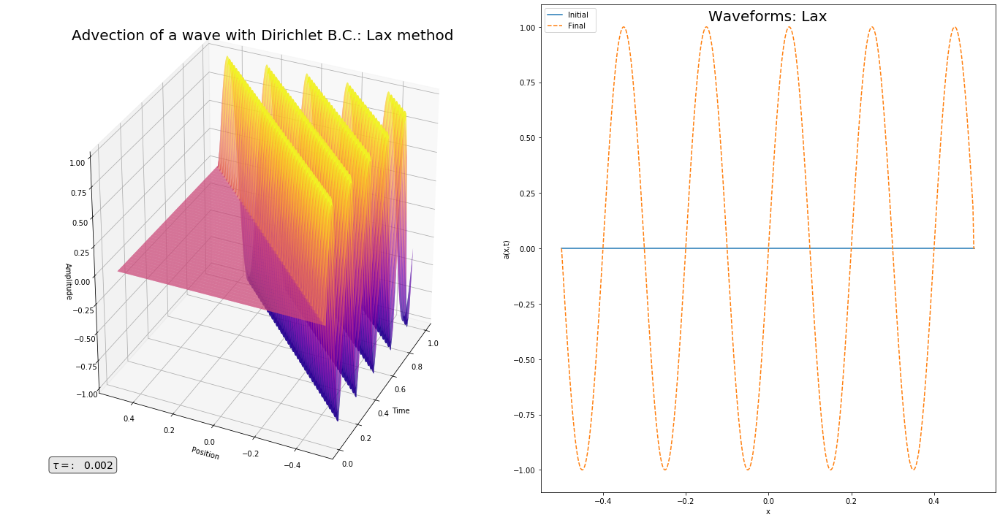

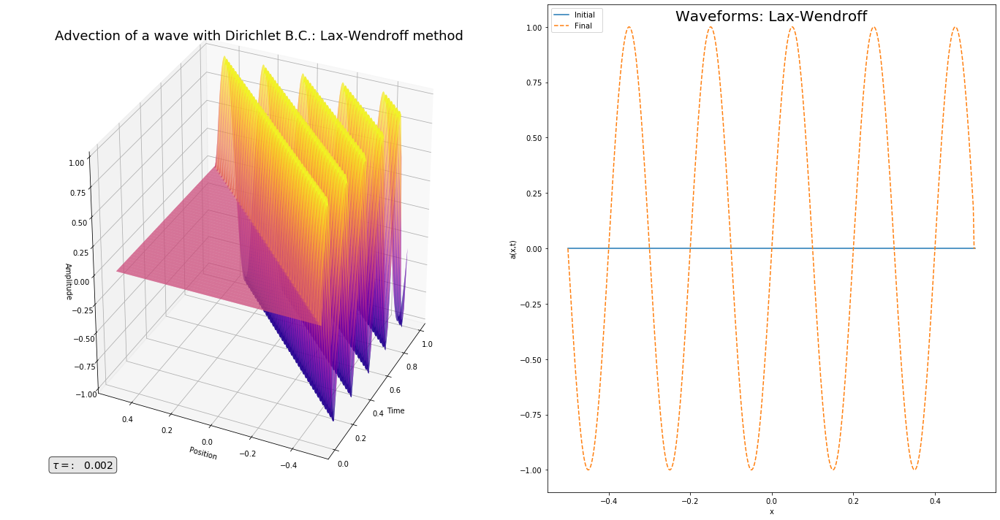

In [111]:
N = 500
tau = .002
w = np.pi * 10

L = 1.      # System size
h = L/N     # Grid spacing
c = 1.      # Wave speed
print('Time for wave to move one grid spacing is ', h/c)
coeff = c*tau/(2.*h)    # Coefficient used by all schemes
coefflw = 2*coeff**2     # Coefficient used by L-W scheme
print('Wave circles system in ', L/(c*tau), ' steps')
nStep = int(input('Enter number of steps: '))

# Set initial and boundary conditions: Dirichlet
sigma = 0.1                  # Width of the Gaussian pulse
k_wave = np.pi/sigma         # Wave number of the cosine
x = np.arange(N)*h - L/2.    # Coordinates of grid points

# Initial condition is zero
a1 = np.zeros(N)
a2 = np.zeros(N)
a3 = np.zeros(N)

#* Initialize plotting variables.
iplot = 1           # Plot counter
nplots = 50         # Desired number of plots
a1plot = np.empty((N,nplots))
a2plot = np.empty((N,nplots))
a3plot = np.empty((N,nplots))
tplot = np.empty(nplots)
a1plot[:,0] = np.copy(a1)     
a2plot[:,0] = np.copy(a2)     
a3plot[:,0] = np.copy(a3)     
tplot[0] = 0                # Record the initial time (t=0)
plotStep = nStep/nplots +1  # Number of steps between plots

for iStep in range(nStep):  ## MAIN LOOP ##
    ### FTCS method ###
    a1[1:N-2] = a1[1:N-2] - coeff*( a1[2:N-1] - a1[0:N-3] )
    a1[0] = np.sin(w*tau*(iStep+1))
    
    ### Lax method ###
    a2[1:N-2] = .5*( a2[2:N-1] + a2[0:N-3] ) - coeff*( a2[2:N-1] - a2[0:N-3] )   
    a2[0] = np.sin(w*tau*(iStep+1))
    
    ### Lax-Wendroff ###
    a3[1:N-2] = ( a3[1:N-2] - coeff*( a3[2:N-1] - a3[0:N-3] ) +
                 coefflw*( a3[2:N-1] + a3[0:N-3] - 2*a3[1:N-2] ) )    
    a3[0] = np.sin(w*tau*(iStep+1))

    # Periodically record a(t) for plotting.
    if (iStep+1) % plotStep < 1 :        # Every plot_iter steps record 
        a1plot[:,iplot] = np.copy(a1)
        a2plot[:,iplot] = np.copy(a2)
        a3plot[:,iplot] = np.copy(a3)
        tplot[iplot] = tau*(iStep+1)
        iplot += 1

Tp, Xp = np.meshgrid(tplot[0:iplot], x)

### FTCS Plot ###
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')

surf = ax.plot_surface(Tp, Xp, a1plot[:,0:iplot], rstride=1, cstride=1, 
                       cmap=cmp)
ax.set_xlabel('Time')
ax.set_ylabel('Position')
ax.set_zlabel('Amplitude')
ax.set_title('Advection of a wave with Dirichlet B.C.: FTCS method', fontsize = 20)
ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
        fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
ax.view_init(30, 205)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x,a1plot[:,0],'-',x,a1,'--');
plt.legend(['Initial  ','Final'])
ax.set_title('Waveforms: FTCS', fontsize = 20, y = .959)
ax.set_xlabel('x')
ax.set_ylabel('a(x,t)')
plt.tight_layout()
plt.show()

### Lax Plot ###
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')

surf = ax.plot_surface(Tp, Xp, a2plot[:,0:iplot], rstride=1, cstride=1, 
                       cmap=cmp)
ax.set_xlabel('Time')
ax.set_ylabel('Position')
ax.set_zlabel('Amplitude')
ax.set_title('Advection of a wave with Dirichlet B.C.: Lax method', fontsize = 20)
ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
        fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
ax.view_init(30, 205)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x,a2plot[:,0],'-',x,a2,'--');
plt.legend(['Initial  ','Final'])
ax.set_title('Waveforms: Lax', fontsize = 20, y = .959)
ax.set_xlabel('x')
ax.set_ylabel('a(x,t)')
plt.tight_layout()
plt.show()

### Lax-Wendroff Plot ###
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')

surf = ax.plot_surface(Tp, Xp, a3plot[:,0:iplot], rstride=1, cstride=1, 
                       cmap=cmp)
ax.set_xlabel('Time')
ax.set_ylabel('Position')
ax.set_zlabel('Amplitude')
ax.set_title('Advection of a wave with Dirichlet B.C.: Lax-Wendroff method', fontsize = 18)
ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
        fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
ax.view_init(30, 205)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x,a3plot[:,0],'-',x,a3,'--');
plt.legend(['Initial  ','Final'])
ax.set_title('Waveforms: Lax-Wendroff', fontsize = 20, y = .959)
ax.set_xlabel('x')
ax.set_ylabel('a(x,t)')
plt.tight_layout()
plt.show()

# Problem 1: 7.2
## FTCS, Lax, Lax-Wendroff methods
### Dirichlet: $[\text{sin}(\omega t), 0] \qquad \tau = .03$

Time for wave to move one grid spacing is  0.02
Wave circles system in  33.333333333333336  steps
Enter number of steps: 34


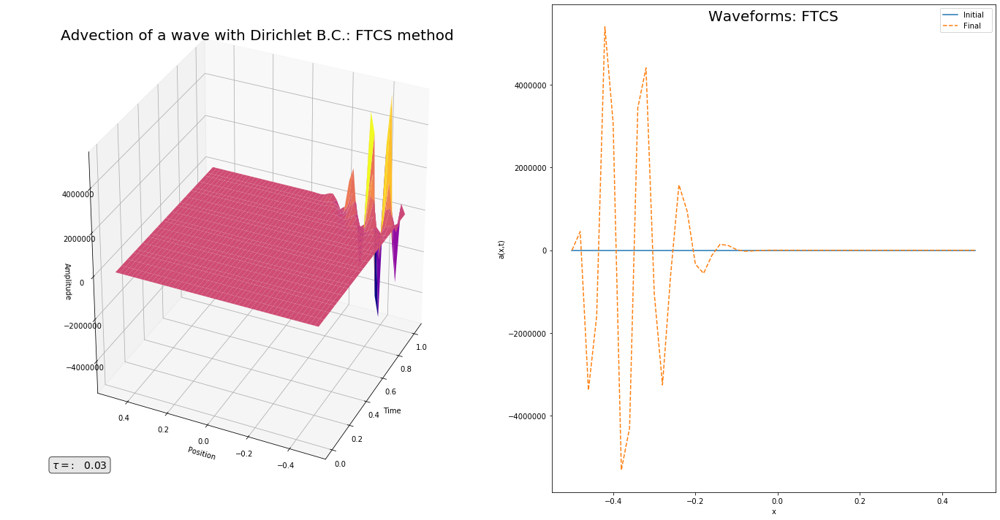

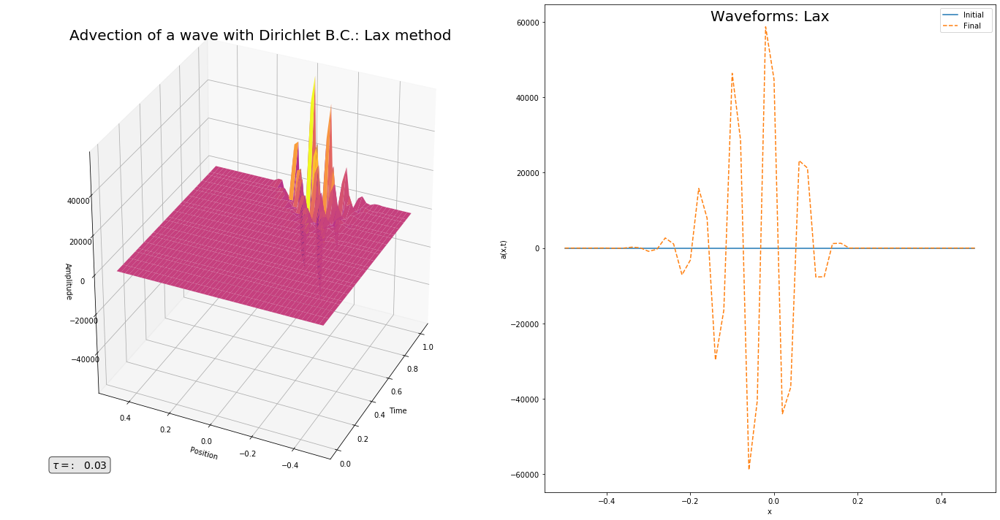

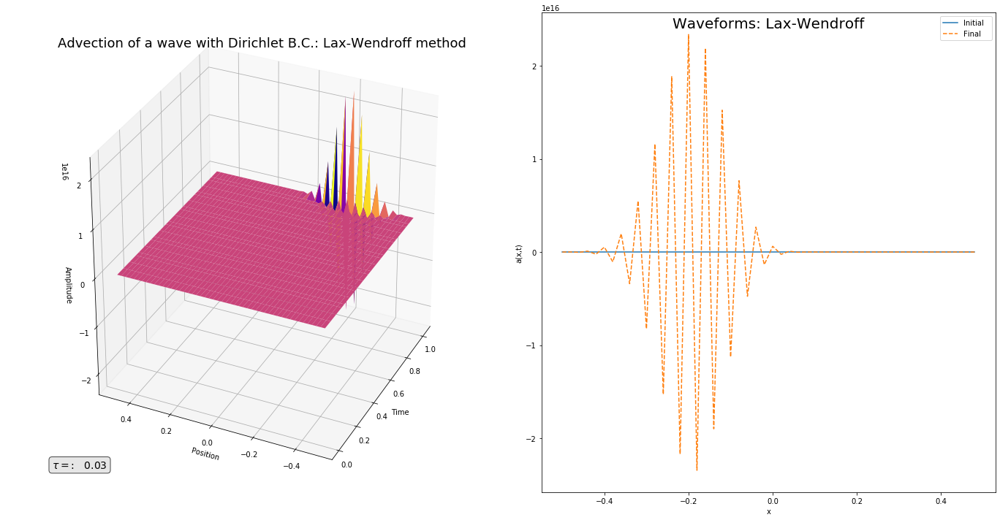

In [115]:
N = 50
tau = .03
w = np.pi * 10

L = 1.      # System size
h = L/N     # Grid spacing
c = 1.      # Wave speed
print('Time for wave to move one grid spacing is ', h/c)
coeff = c*tau/(2.*h)    # Coefficient used by all schemes
coefflw = 2*coeff**2     # Coefficient used by L-W scheme
print('Wave circles system in ', L/(c*tau), ' steps')
nStep = int(input('Enter number of steps: '))

# Set initial and boundary conditions: Dirichlet
sigma = 0.1                  # Width of the Gaussian pulse
k_wave = np.pi/sigma         # Wave number of the cosine
x = np.arange(N)*h - L/2.    # Coordinates of grid points

# Initial condition is zero
a1 = np.zeros(N)
a2 = np.zeros(N)
a3 = np.zeros(N)

#* Initialize plotting variables.
iplot = 1           # Plot counter
nplots = 50         # Desired number of plots
a1plot = np.empty((N,nplots))
a2plot = np.empty((N,nplots))
a3plot = np.empty((N,nplots))
tplot = np.empty(nplots)
a1plot[:,0] = np.copy(a1)     
a2plot[:,0] = np.copy(a2)     
a3plot[:,0] = np.copy(a3)     
tplot[0] = 0                # Record the initial time (t=0)
plotStep = nStep/nplots +1  # Number of steps between plots

for iStep in range(nStep):  ## MAIN LOOP ##
    ### FTCS method ###
    a1[1:N-2] = a1[1:N-2] - coeff*( a1[2:N-1] - a1[0:N-3] )
    a1[0] = np.sin(w*tau*(iStep+1))
    
    ### Lax method ###
    a2[1:N-2] = .5*( a2[2:N-1] + a2[0:N-3] ) - coeff*( a2[2:N-1] - a2[0:N-3] )   
    a2[0] = np.sin(w*tau*(iStep+1))
    
    ### Lax-Wendroff ###
    a3[1:N-2] = ( a3[1:N-2] - coeff*( a3[2:N-1] - a3[0:N-3] ) +
                 coefflw*( a3[2:N-1] + a3[0:N-3] - 2*a3[1:N-2] ) )    
    a3[0] = np.sin(w*tau*(iStep+1))

    # Periodically record a(t) for plotting.
    if (iStep+1) % plotStep < 1 :        # Every plot_iter steps record 
        a1plot[:,iplot] = np.copy(a1)
        a2plot[:,iplot] = np.copy(a2)
        a3plot[:,iplot] = np.copy(a3)
        tplot[iplot] = tau*(iStep+1)
        iplot += 1

Tp, Xp = np.meshgrid(tplot[0:iplot], x)

### FTCS Plot ###
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')

surf = ax.plot_surface(Tp, Xp, a1plot[:,0:iplot], rstride=1, cstride=1, 
                       cmap=cmp)
ax.set_xlabel('Time')
ax.set_ylabel('Position')
ax.set_zlabel('Amplitude')
ax.set_title('Advection of a wave with Dirichlet B.C.: FTCS method', fontsize = 20)
ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
        fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
ax.view_init(30, 205)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x,a1plot[:,0],'-',x,a1,'--');
plt.legend(['Initial  ','Final'])
ax.set_title('Waveforms: FTCS', fontsize = 20, y = .959)
ax.set_xlabel('x')
ax.set_ylabel('a(x,t)')
plt.tight_layout()
plt.show()

### Lax Plot ###
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')

surf = ax.plot_surface(Tp, Xp, a2plot[:,0:iplot], rstride=1, cstride=1, 
                       cmap=cmp)
ax.set_xlabel('Time')
ax.set_ylabel('Position')
ax.set_zlabel('Amplitude')
ax.set_title('Advection of a wave with Dirichlet B.C.: Lax method', fontsize = 20)
ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
        fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
ax.view_init(30, 205)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x,a2plot[:,0],'-',x,a2,'--');
plt.legend(['Initial  ','Final'])
ax.set_title('Waveforms: Lax', fontsize = 20, y = .959)
ax.set_xlabel('x')
ax.set_ylabel('a(x,t)')
plt.tight_layout()
plt.show()

### Lax-Wendroff Plot ###
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')

surf = ax.plot_surface(Tp, Xp, a3plot[:,0:iplot], rstride=1, cstride=1, 
                       cmap=cmp)
ax.set_xlabel('Time')
ax.set_ylabel('Position')
ax.set_zlabel('Amplitude')
ax.set_title('Advection of a wave with Dirichlet B.C.: Lax-Wendroff method', fontsize = 18)
ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
        fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
ax.view_init(30, 205)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x,a3plot[:,0],'-',x,a3,'--');
plt.legend(['Initial  ','Final'])
ax.set_title('Waveforms: Lax-Wendroff', fontsize = 20, y = .959)
ax.set_xlabel('x')
ax.set_ylabel('a(x,t)')
plt.tight_layout()
plt.show()

Time for wave to move one grid spacing is  0.002
Wave circles system in  333.3333333333333  steps
Enter number of steps: 334


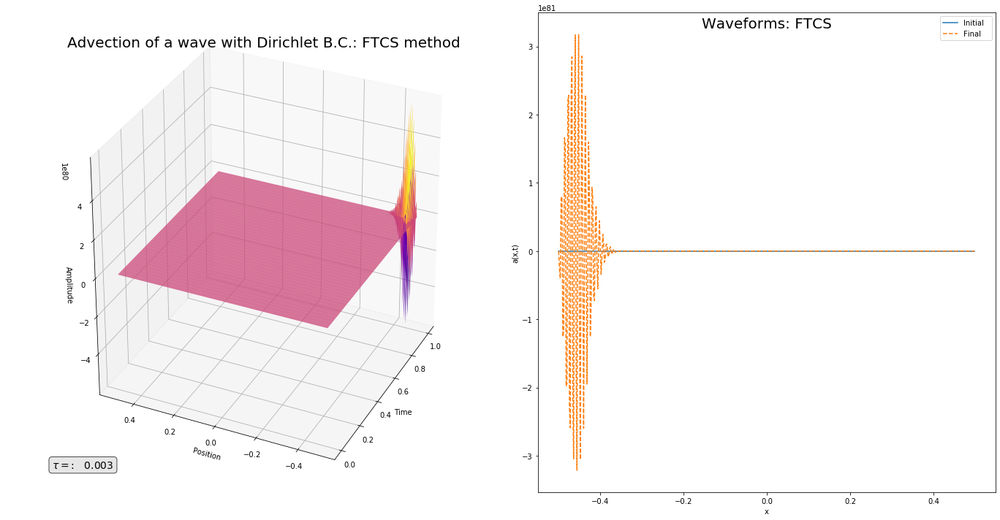

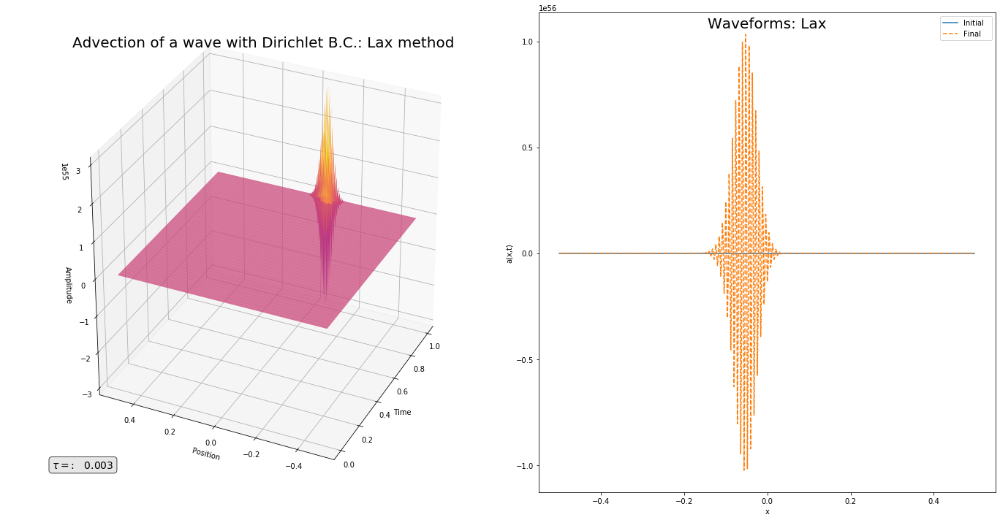

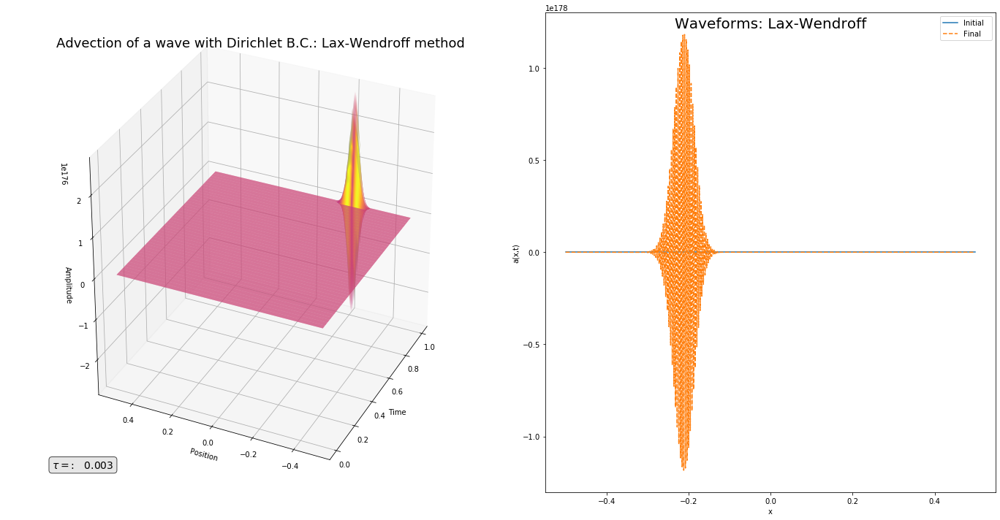

In [116]:
N = 500
tau = .003
w = np.pi * 10

L = 1.      # System size
h = L/N     # Grid spacing
c = 1.      # Wave speed
print('Time for wave to move one grid spacing is ', h/c)
coeff = c*tau/(2.*h)    # Coefficient used by all schemes
coefflw = 2*coeff**2     # Coefficient used by L-W scheme
print('Wave circles system in ', L/(c*tau), ' steps')
nStep = int(input('Enter number of steps: '))

# Set initial and boundary conditions: Dirichlet
sigma = 0.1                  # Width of the Gaussian pulse
k_wave = np.pi/sigma         # Wave number of the cosine
x = np.arange(N)*h - L/2.    # Coordinates of grid points

# Initial condition is zero
a1 = np.zeros(N)
a2 = np.zeros(N)
a3 = np.zeros(N)

#* Initialize plotting variables.
iplot = 1           # Plot counter
nplots = 50         # Desired number of plots
a1plot = np.empty((N,nplots))
a2plot = np.empty((N,nplots))
a3plot = np.empty((N,nplots))
tplot = np.empty(nplots)
a1plot[:,0] = np.copy(a1)     
a2plot[:,0] = np.copy(a2)     
a3plot[:,0] = np.copy(a3)     
tplot[0] = 0                # Record the initial time (t=0)
plotStep = nStep/nplots +1  # Number of steps between plots

for iStep in range(nStep):  ## MAIN LOOP ##
    ### FTCS method ###
    a1[1:N-2] = a1[1:N-2] - coeff*( a1[2:N-1] - a1[0:N-3] )
    a1[0] = np.sin(w*tau*(iStep+1))
    
    ### Lax method ###
    a2[1:N-2] = .5*( a2[2:N-1] + a2[0:N-3] ) - coeff*( a2[2:N-1] - a2[0:N-3] )   
    a2[0] = np.sin(w*tau*(iStep+1))
    
    ### Lax-Wendroff ###
    a3[1:N-2] = ( a3[1:N-2] - coeff*( a3[2:N-1] - a3[0:N-3] ) +
                 coefflw*( a3[2:N-1] + a3[0:N-3] - 2*a3[1:N-2] ) )    
    a3[0] = np.sin(w*tau*(iStep+1))

    # Periodically record a(t) for plotting.
    if (iStep+1) % plotStep < 1 :        # Every plot_iter steps record 
        a1plot[:,iplot] = np.copy(a1)
        a2plot[:,iplot] = np.copy(a2)
        a3plot[:,iplot] = np.copy(a3)
        tplot[iplot] = tau*(iStep+1)
        iplot += 1

Tp, Xp = np.meshgrid(tplot[0:iplot], x)

### FTCS Plot ###
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')

surf = ax.plot_surface(Tp, Xp, a1plot[:,0:iplot], rstride=1, cstride=1, 
                       cmap=cmp)
ax.set_xlabel('Time')
ax.set_ylabel('Position')
ax.set_zlabel('Amplitude')
ax.set_title('Advection of a wave with Dirichlet B.C.: FTCS method', fontsize = 20)
ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
        fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
ax.view_init(30, 205)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x,a1plot[:,0],'-',x,a1,'--');
plt.legend(['Initial  ','Final'])
ax.set_title('Waveforms: FTCS', fontsize = 20, y = .959)
ax.set_xlabel('x')
ax.set_ylabel('a(x,t)')
plt.tight_layout()
plt.show()

### Lax Plot ###
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')

surf = ax.plot_surface(Tp, Xp, a2plot[:,0:iplot], rstride=1, cstride=1, 
                       cmap=cmp)
ax.set_xlabel('Time')
ax.set_ylabel('Position')
ax.set_zlabel('Amplitude')
ax.set_title('Advection of a wave with Dirichlet B.C.: Lax method', fontsize = 20)
ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
        fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
ax.view_init(30, 205)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x,a2plot[:,0],'-',x,a2,'--');
plt.legend(['Initial  ','Final'])
ax.set_title('Waveforms: Lax', fontsize = 20, y = .959)
ax.set_xlabel('x')
ax.set_ylabel('a(x,t)')
plt.tight_layout()
plt.show()

### Lax-Wendroff Plot ###
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')

surf = ax.plot_surface(Tp, Xp, a3plot[:,0:iplot], rstride=1, cstride=1, 
                       cmap=cmp)
ax.set_xlabel('Time')
ax.set_ylabel('Position')
ax.set_zlabel('Amplitude')
ax.set_title('Advection of a wave with Dirichlet B.C.: Lax-Wendroff method', fontsize = 18)
ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
        fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
ax.view_init(30, 205)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x,a3plot[:,0],'-',x,a3,'--');
plt.legend(['Initial  ','Final'])
ax.set_title('Waveforms: Lax-Wendroff', fontsize = 20, y = .959)
ax.set_xlabel('x')
ax.set_ylabel('a(x,t)')
plt.tight_layout()
plt.show()

Time for wave to move one grid spacing is  0.02
Wave circles system in  50.0  steps
Enter number of steps: 50


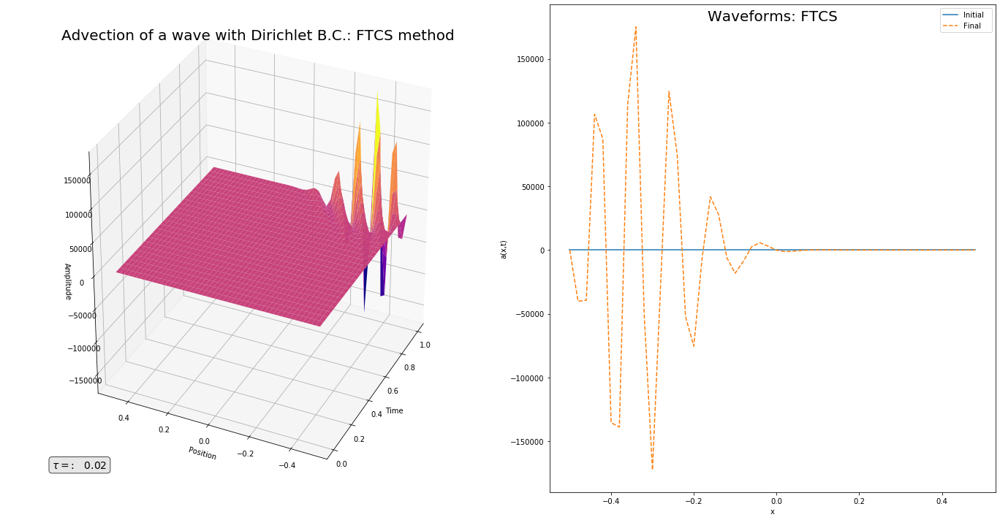

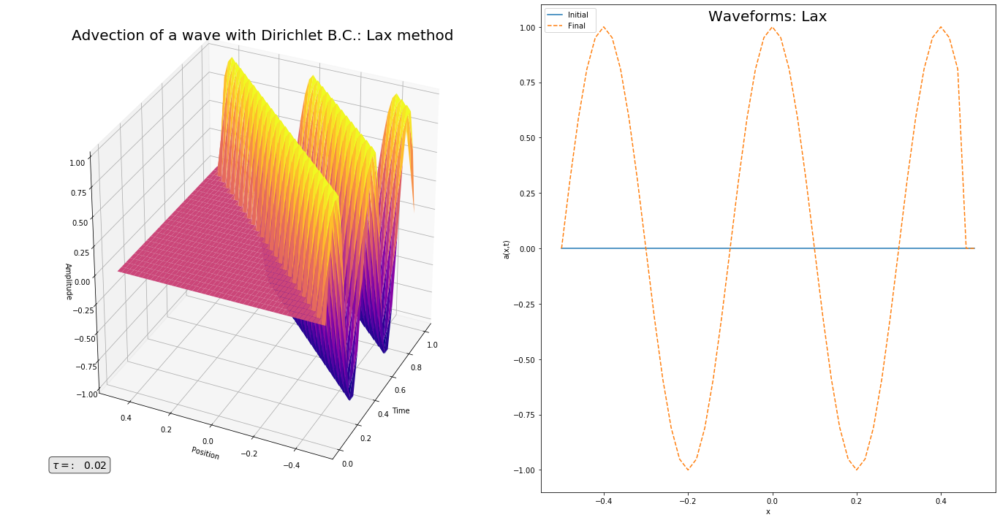

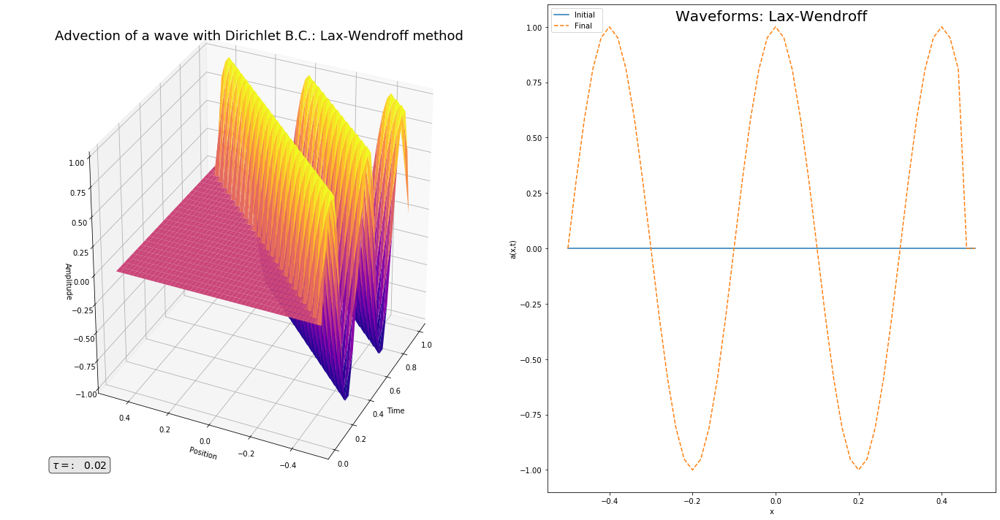

In [4]:
N = 50
tau = .02
w = np.pi * 5

L = 1.      # System size
h = L/N     # Grid spacing
c = 1.      # Wave speed
print('Time for wave to move one grid spacing is ', h/c)
coeff = c*tau/(2.*h)    # Coefficient used by all schemes
coefflw = 2*coeff**2     # Coefficient used by L-W scheme
print('Wave circles system in ', L/(c*tau), ' steps')
nStep = int(input('Enter number of steps: '))

# Set initial and boundary conditions: Dirichlet
sigma = 0.1                  # Width of the Gaussian pulse
k_wave = np.pi/sigma         # Wave number of the cosine
x = np.arange(N)*h - L/2.    # Coordinates of grid points

# Initial condition is zero
a1 = np.zeros(N)
a2 = np.zeros(N)
a3 = np.zeros(N)

#* Initialize plotting variables.
iplot = 1           # Plot counter
nplots = 50         # Desired number of plots
a1plot = np.empty((N,nplots))
a2plot = np.empty((N,nplots))
a3plot = np.empty((N,nplots))
tplot = np.empty(nplots)
a1plot[:,0] = np.copy(a1)     
a2plot[:,0] = np.copy(a2)     
a3plot[:,0] = np.copy(a3)     
tplot[0] = 0                # Record the initial time (t=0)
plotStep = nStep/nplots +1  # Number of steps between plots

for iStep in range(nStep):  ## MAIN LOOP ##
    ### FTCS method ###
    a1[1:N-2] = a1[1:N-2] - coeff*( a1[2:N-1] - a1[0:N-3] )
    a1[0] = np.sin(w*tau*(iStep+1))
    
    ### Lax method ###
    a2[1:N-2] = .5*( a2[2:N-1] + a2[0:N-3] ) - coeff*( a2[2:N-1] - a2[0:N-3] )   
    a2[0] = np.sin(w*tau*(iStep+1))
    
    ### Lax-Wendroff ###
    a3[1:N-2] = ( a3[1:N-2] - coeff*( a3[2:N-1] - a3[0:N-3] ) +
                 coefflw*( a3[2:N-1] + a3[0:N-3] - 2*a3[1:N-2] ) )    
    a3[0] = np.sin(w*tau*(iStep+1))

    # Periodically record a(t) for plotting.
    if (iStep+1) % plotStep < 1 :        # Every plot_iter steps record 
        a1plot[:,iplot] = np.copy(a1)
        a2plot[:,iplot] = np.copy(a2)
        a3plot[:,iplot] = np.copy(a3)
        tplot[iplot] = tau*(iStep+1)
        iplot += 1

Tp, Xp = np.meshgrid(tplot[0:iplot], x)

### FTCS Plot ###
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')

surf = ax.plot_surface(Tp, Xp, a1plot[:,0:iplot], rstride=1, cstride=1, 
                       cmap=cmp)
ax.set_xlabel('Time')
ax.set_ylabel('Position')
ax.set_zlabel('Amplitude')
ax.set_title('Advection of a wave with Dirichlet B.C.: FTCS method', fontsize = 20)
ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
        fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
ax.view_init(30, 205)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x,a1plot[:,0],'-',x,a1,'--');
plt.legend(['Initial  ','Final'])
ax.set_title('Waveforms: FTCS', fontsize = 20, y = .959)
ax.set_xlabel('x')
ax.set_ylabel('a(x,t)')
plt.tight_layout()
plt.show()

### Lax Plot ###
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')

surf = ax.plot_surface(Tp, Xp, a2plot[:,0:iplot], rstride=1, cstride=1, 
                       cmap=cmp)
ax.set_xlabel('Time')
ax.set_ylabel('Position')
ax.set_zlabel('Amplitude')
ax.set_title('Advection of a wave with Dirichlet B.C.: Lax method', fontsize = 20)
ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
        fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
ax.view_init(30, 205)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x,a2plot[:,0],'-',x,a2,'--');
plt.legend(['Initial  ','Final'])
ax.set_title('Waveforms: Lax', fontsize = 20, y = .959)
ax.set_xlabel('x')
ax.set_ylabel('a(x,t)')
plt.tight_layout()
plt.show()

### Lax-Wendroff Plot ###
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')

surf = ax.plot_surface(Tp, Xp, a3plot[:,0:iplot], rstride=1, cstride=1, 
                       cmap=cmp)
ax.set_xlabel('Time')
ax.set_ylabel('Position')
ax.set_zlabel('Amplitude')
ax.set_title('Advection of a wave with Dirichlet B.C.: Lax-Wendroff method', fontsize = 18)
ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
        fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
ax.view_init(30, 205)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x,a3plot[:,0],'-',x,a3,'--');
plt.legend(['Initial  ','Final'])
ax.set_title('Waveforms: Lax-Wendroff', fontsize = 20, y = .959)
ax.set_xlabel('x')
ax.set_ylabel('a(x,t)')
plt.tight_layout()
plt.show()

Time for wave to move one grid spacing is  0.02
Wave circles system in  50.0  steps
Enter number of steps: 50


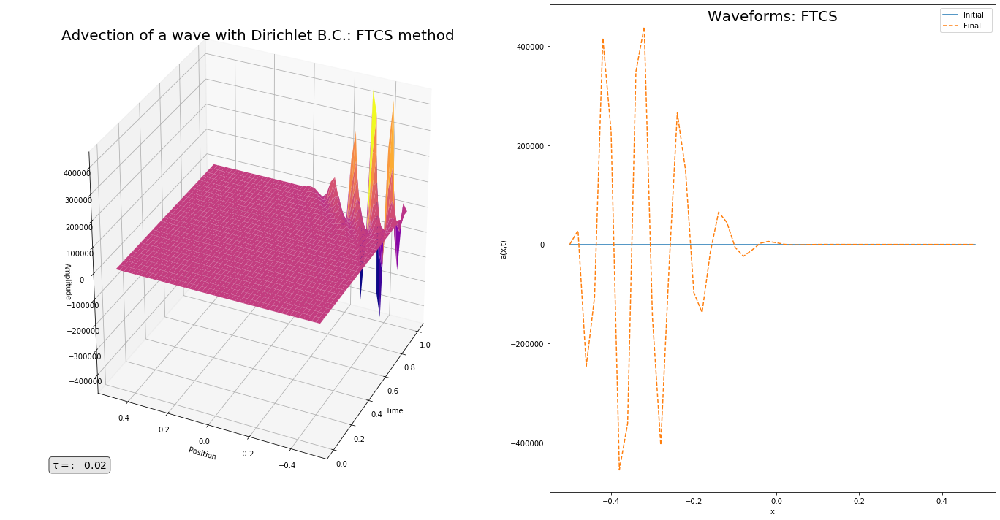

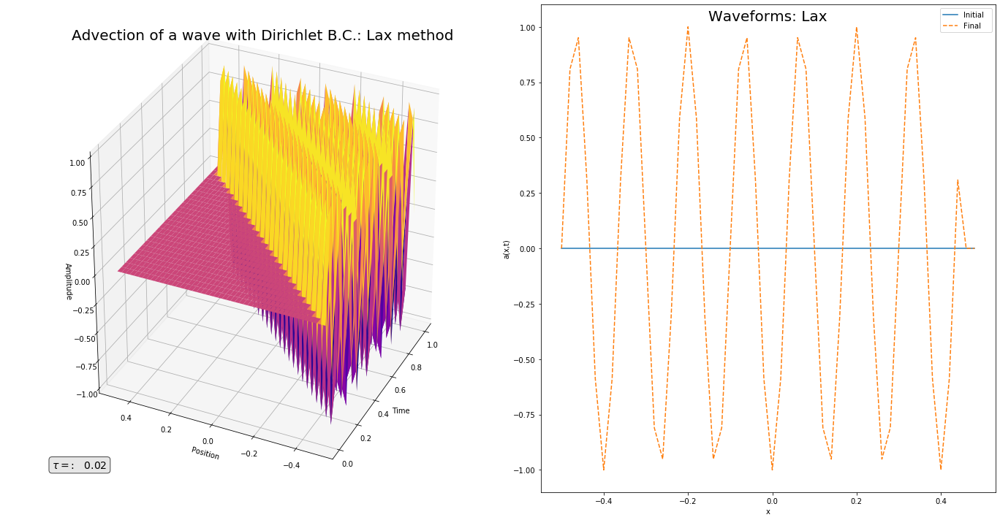

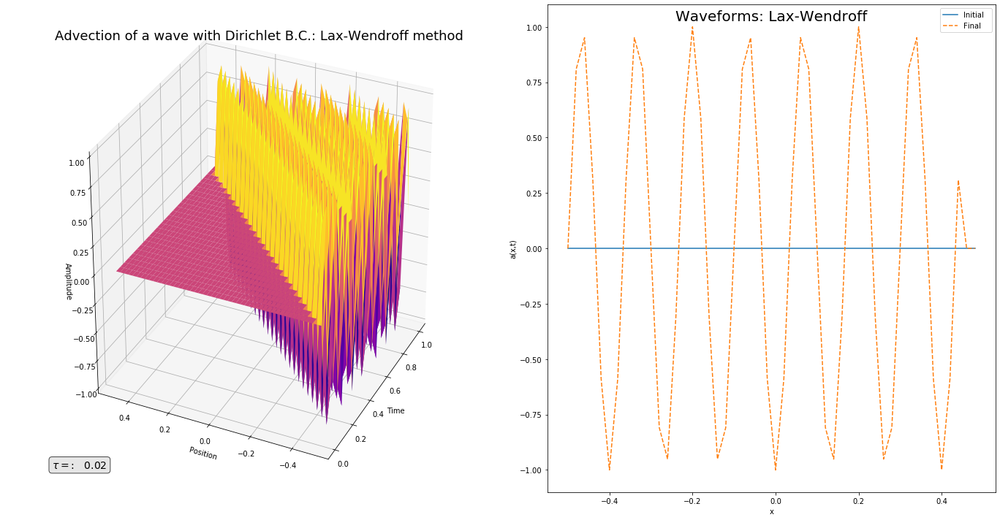

In [5]:
N = 50
tau = .02
w = np.pi * 15

L = 1.      # System size
h = L/N     # Grid spacing
c = 1.      # Wave speed
print('Time for wave to move one grid spacing is ', h/c)
coeff = c*tau/(2.*h)    # Coefficient used by all schemes
coefflw = 2*coeff**2     # Coefficient used by L-W scheme
print('Wave circles system in ', L/(c*tau), ' steps')
nStep = int(input('Enter number of steps: '))

# Set initial and boundary conditions: Dirichlet
sigma = 0.1                  # Width of the Gaussian pulse
k_wave = np.pi/sigma         # Wave number of the cosine
x = np.arange(N)*h - L/2.    # Coordinates of grid points

# Initial condition is zero
a1 = np.zeros(N)
a2 = np.zeros(N)
a3 = np.zeros(N)

#* Initialize plotting variables.
iplot = 1           # Plot counter
nplots = 50         # Desired number of plots
a1plot = np.empty((N,nplots))
a2plot = np.empty((N,nplots))
a3plot = np.empty((N,nplots))
tplot = np.empty(nplots)
a1plot[:,0] = np.copy(a1)     
a2plot[:,0] = np.copy(a2)     
a3plot[:,0] = np.copy(a3)     
tplot[0] = 0                # Record the initial time (t=0)
plotStep = nStep/nplots +1  # Number of steps between plots

for iStep in range(nStep):  ## MAIN LOOP ##
    ### FTCS method ###
    a1[1:N-2] = a1[1:N-2] - coeff*( a1[2:N-1] - a1[0:N-3] )
    a1[0] = np.sin(w*tau*(iStep+1))
    
    ### Lax method ###
    a2[1:N-2] = .5*( a2[2:N-1] + a2[0:N-3] ) - coeff*( a2[2:N-1] - a2[0:N-3] )   
    a2[0] = np.sin(w*tau*(iStep+1))
    
    ### Lax-Wendroff ###
    a3[1:N-2] = ( a3[1:N-2] - coeff*( a3[2:N-1] - a3[0:N-3] ) +
                 coefflw*( a3[2:N-1] + a3[0:N-3] - 2*a3[1:N-2] ) )    
    a3[0] = np.sin(w*tau*(iStep+1))

    # Periodically record a(t) for plotting.
    if (iStep+1) % plotStep < 1 :        # Every plot_iter steps record 
        a1plot[:,iplot] = np.copy(a1)
        a2plot[:,iplot] = np.copy(a2)
        a3plot[:,iplot] = np.copy(a3)
        tplot[iplot] = tau*(iStep+1)
        iplot += 1

Tp, Xp = np.meshgrid(tplot[0:iplot], x)

### FTCS Plot ###
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')

surf = ax.plot_surface(Tp, Xp, a1plot[:,0:iplot], rstride=1, cstride=1, 
                       cmap=cmp)
ax.set_xlabel('Time')
ax.set_ylabel('Position')
ax.set_zlabel('Amplitude')
ax.set_title('Advection of a wave with Dirichlet B.C.: FTCS method', fontsize = 20)
ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
        fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
ax.view_init(30, 205)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x,a1plot[:,0],'-',x,a1,'--');
plt.legend(['Initial  ','Final'])
ax.set_title('Waveforms: FTCS', fontsize = 20, y = .959)
ax.set_xlabel('x')
ax.set_ylabel('a(x,t)')
plt.tight_layout()
plt.show()

### Lax Plot ###
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')

surf = ax.plot_surface(Tp, Xp, a2plot[:,0:iplot], rstride=1, cstride=1, 
                       cmap=cmp)
ax.set_xlabel('Time')
ax.set_ylabel('Position')
ax.set_zlabel('Amplitude')
ax.set_title('Advection of a wave with Dirichlet B.C.: Lax method', fontsize = 20)
ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
        fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
ax.view_init(30, 205)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x,a2plot[:,0],'-',x,a2,'--');
plt.legend(['Initial  ','Final'])
ax.set_title('Waveforms: Lax', fontsize = 20, y = .959)
ax.set_xlabel('x')
ax.set_ylabel('a(x,t)')
plt.tight_layout()
plt.show()

### Lax-Wendroff Plot ###
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1, 2, 1, projection='3d')

surf = ax.plot_surface(Tp, Xp, a3plot[:,0:iplot], rstride=1, cstride=1, 
                       cmap=cmp)
ax.set_xlabel('Time')
ax.set_ylabel('Position')
ax.set_zlabel('Amplitude')
ax.set_title('Advection of a wave with Dirichlet B.C.: Lax-Wendroff method', fontsize = 18)
ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
        fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
ax.view_init(30, 205)

ax = fig.add_subplot(1, 2, 2)
ax.plot(x,a3plot[:,0],'-',x,a3,'--');
plt.legend(['Initial  ','Final'])
ax.set_title('Waveforms: Lax-Wendroff', fontsize = 20, y = .959)
ax.set_xlabel('x')
ax.set_ylabel('a(x,t)')
plt.tight_layout()
plt.show()

# Problem 2: 7.4
## Linear advection-diffusion using FTCS method
### $T(x,t=0)=\delta (x) \qquad \text{Periodic B.C.s at }x=\pm \frac{L}{2}$

Time for wave to move one grid spacing is  0.006666666666666667
Wave circles system in  666.6666666666666  steps


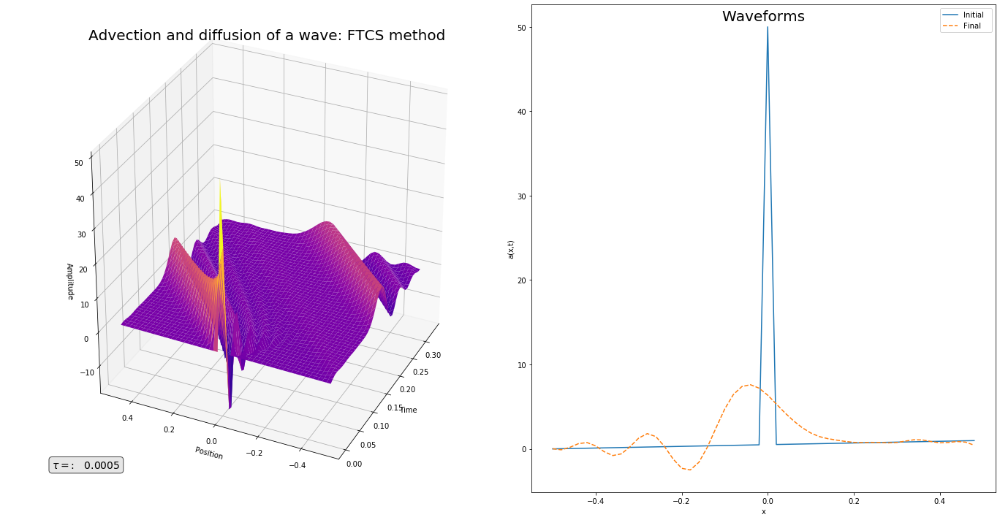

Wave circles system in  333.3333333333333  steps


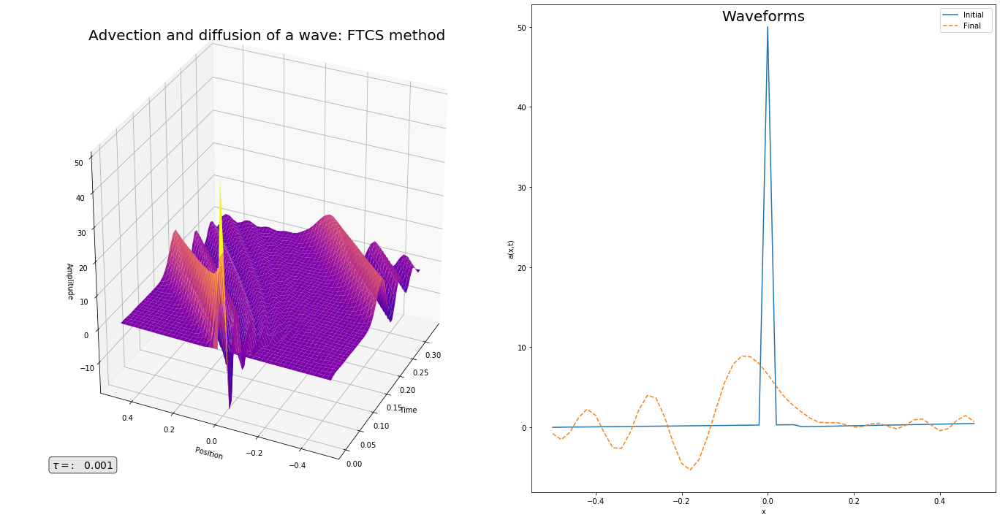

Wave circles system in  66.66666666666667  steps


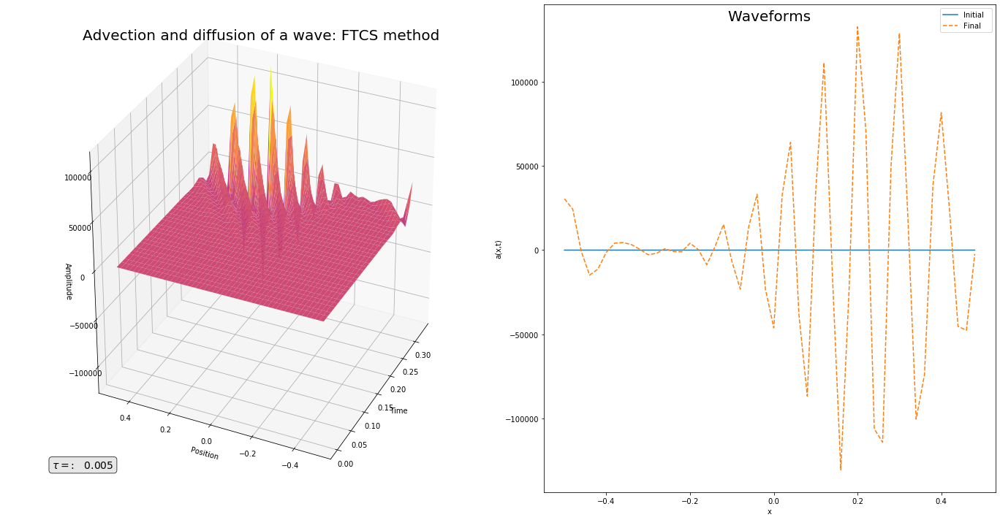

In [24]:
N = 50
tau_lst = np.array([5e-4, 1e-3, 5e-3])
ns_lst = np.array([667,334,67], dtype = int)

L = 1.      # System size
h = L/N     # Grid spacing
c = 3      # Wave speed
kappa = .005  # Diffusion constant
counter = -1
print('Time for wave to move one grid spacing is ', h/c)

# Set initial and boundary conditions: Dirichlet
sigma = 0.1                  # Width of the Gaussian pulse
k_wave = np.pi/sigma         # Wave number of the cosine
x = np.arange(N)*h - L/2.    # Coordinates of grid points


# Use periodic boundary conditions
ip = np.arange(N) + 1  
ip[N-1] = 0          # ip = i+1 with periodic b.c.
im = np.arange(N) - 1  
im[0] = N-1          # im = i-1 with periodic b.c.

for tau in tau_lst:
    counter += 1
    coeff1 = kappa*tau/(h**2)
    coeff2 = c*tau/(2*h)
    print('Wave circles system in ', L/(c*tau), ' steps')
    nStep = ns_lst[counter]
    
    # Initial condition is modulated Gaussian
    a = np.empty(N)
    a[int(N/2)] =  1/h
    
    #* Initialize plotting variables.
    iplot = 1           # Plot counter
    nplots = 50         # Desired number of plots
    aplot = np.empty((N,nplots))
    tplot = np.empty(nplots)
    aplot[:,0] = np.copy(a)     # Record the initial state
    tplot[0] = 0                # Record the initial time (t=0)
    plotStep = nStep/nplots +1  # Number of steps between plots
    
    ## MAIN LOOP ##
    for iStep in range(nStep):
        ### FTCS method ###
        a[:] = (1-2*coeff1)*a[:] + (coeff1 - coeff2)*a[ip] + (coeff1 + coeff2)*a[im]
        # Periodically record a(t) for plotting.
        if (iStep+1) % plotStep < 1 :        # Every plot_iter steps record 
            aplot[:,iplot] = np.copy(a)
            tplot[iplot] = tau*(iStep+1)
            iplot += 1

    Tp, Xp = np.meshgrid(tplot[0:iplot], x)

    ### Upwind Plot ###
    fig = plt.figure(figsize=(20,10))
    ax = fig.add_subplot(1, 2, 1, projection='3d')

    surf = ax.plot_surface(Tp, Xp, aplot[:,0:iplot], rstride=1, cstride=1, 
                           cmap=cmp)
    ax.set_xlabel('Time')
    ax.set_ylabel('Position')
    ax.set_zlabel('Amplitude')
    ax.set_title('Advection and diffusion of a wave: FTCS method', fontsize = 20)
    ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
            fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
    ax.view_init(30, 205)

    ax = fig.add_subplot(1, 2, 2)
    ax.plot(x,aplot[:,0],'-',x,a,'--');
    plt.legend(['Initial  ','Final'])
    ax.set_title('Waveforms', fontsize = 20, y = .959)
    ax.set_xlabel('x')
    ax.set_ylabel('a(x,t)')
    plt.tight_layout()
    plt.show()

Time for wave to move one grid spacing is  0.006666666666666667
Wave circles system in  666.6666666666666  steps


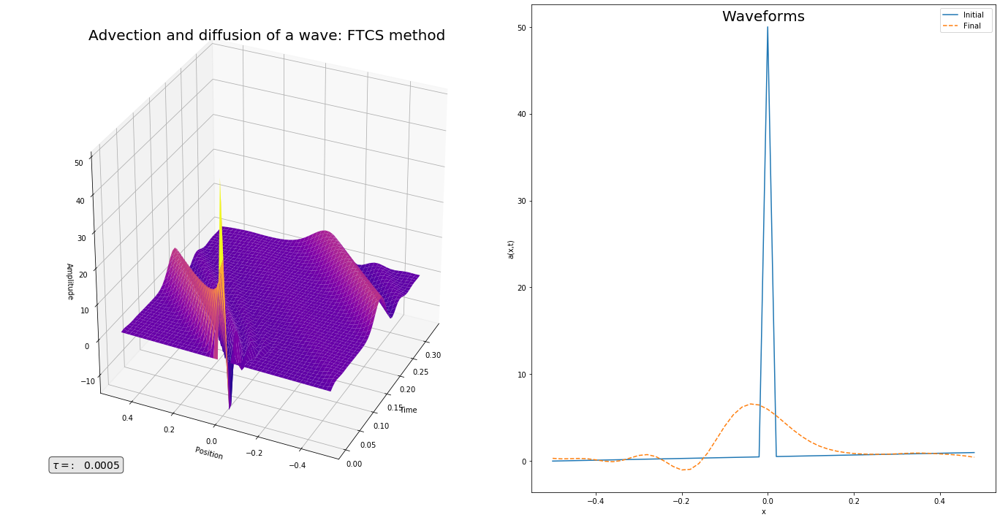

Wave circles system in  333.3333333333333  steps


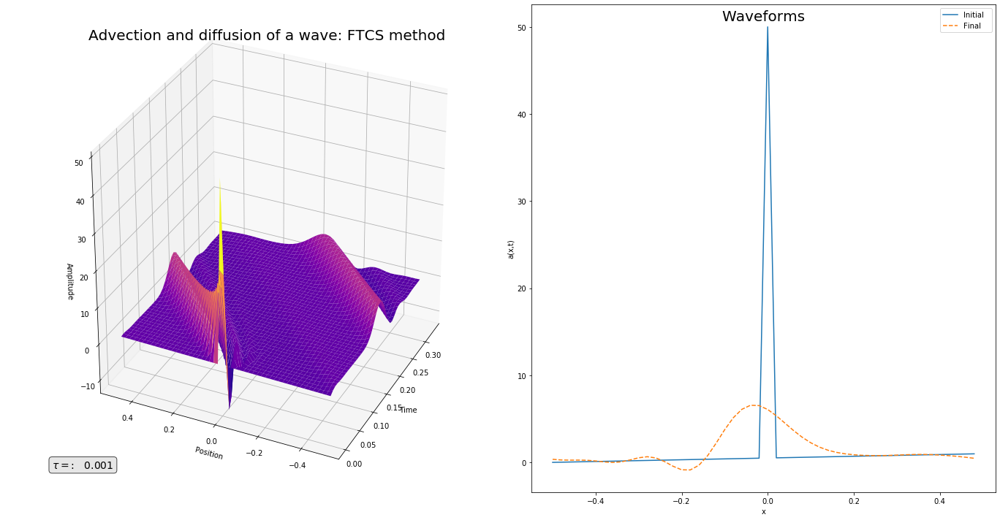

Wave circles system in  106.66666666666666  steps


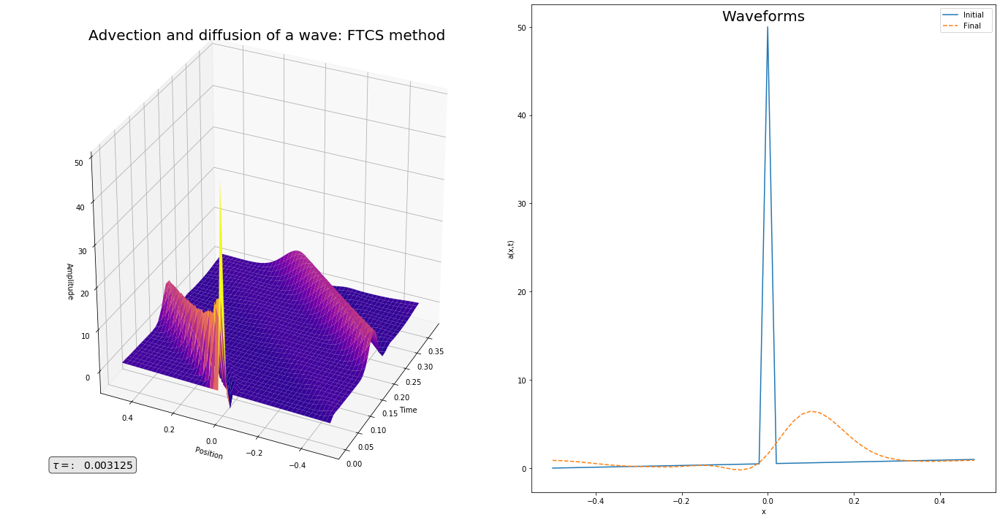

Wave circles system in  66.66666666666667  steps


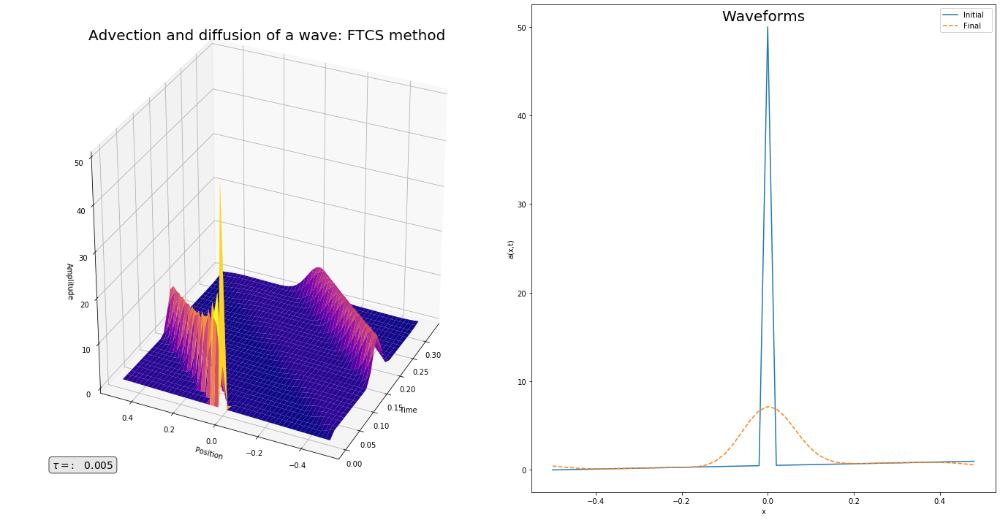

Wave circles system in  33.333333333333336  steps


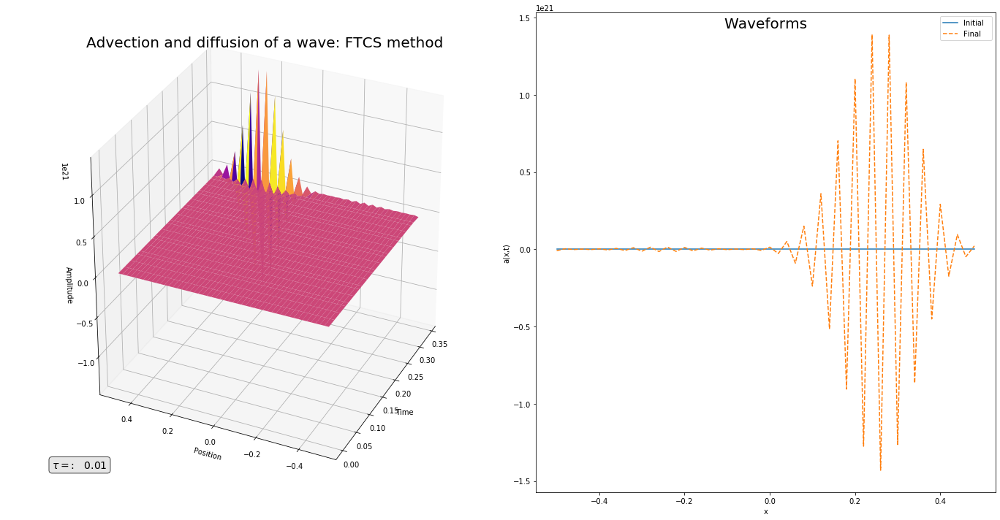

In [27]:
N = 50
tau_lst = np.array([5e-4, 1e-3, .003125, 5e-3, 1e-2])
ns_lst = np.array([667,334,120,67,34], dtype = int)

L = 1.      # System size
h = L/N     # Grid spacing
c = 3      # Wave speed
kappa = .005  # Diffusion constant
counter = -1
print('Time for wave to move one grid spacing is ', h/c)

# Set initial and boundary conditions: Dirichlet
sigma = 0.1                  # Width of the Gaussian pulse
k_wave = np.pi/sigma         # Wave number of the cosine
x = np.arange(N)*h - L/2.    # Coordinates of grid points


# Use periodic boundary conditions
ip = np.arange(N) + 1  
ip[N-1] = 0          # ip = i+1 with periodic b.c.
im = np.arange(N) - 1  
im[0] = N-1          # im = i-1 with periodic b.c.

for tau in tau_lst:
    counter += 1
    coeff1 = kappa*tau/(h**2)
    coeff2 = c*tau/(2*h)
    print('Wave circles system in ', L/(c*tau), ' steps')
    nStep = ns_lst[counter]
    
    # Initial condition is modulated Gaussian
    a = np.empty(N)
    a[int(N/2)] =  1/h
    
    #* Initialize plotting variables.
    iplot = 1           # Plot counter
    nplots = 50         # Desired number of plots
    aplot = np.empty((N,nplots))
    tplot = np.empty(nplots)
    aplot[:,0] = np.copy(a)     # Record the initial state
    tplot[0] = 0                # Record the initial time (t=0)
    plotStep = nStep/nplots +1  # Number of steps between plots
    
    ## MAIN LOOP ##
    for iStep in range(nStep):
        ### Lax-Wendroff method ###
        a[:] = ((1-2*coeff1-(2*coeff2)**2)*a[:] + .5*(2*coeff1-2*coeff2+(2*coeff2)**2)*a[ip] + 
                .5*(2*coeff1+2*coeff2+(2*coeff2)**2)*a[im])
        # Periodically record a(t) for plotting.
        if (iStep+1) % plotStep < 1 :        # Every plot_iter steps record 
            aplot[:,iplot] = np.copy(a)
            tplot[iplot] = tau*(iStep+1)
            iplot += 1

    Tp, Xp = np.meshgrid(tplot[0:iplot], x)

    ### Upwind Plot ###
    fig = plt.figure(figsize=(20,10))
    ax = fig.add_subplot(1, 2, 1, projection='3d')

    surf = ax.plot_surface(Tp, Xp, aplot[:,0:iplot], rstride=1, cstride=1, 
                           cmap=cmp)
    ax.set_xlabel('Time')
    ax.set_ylabel('Position')
    ax.set_zlabel('Amplitude')
    ax.set_title('Advection and diffusion of a wave: FTCS method', fontsize = 20)
    ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
            fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
    ax.view_init(30, 205)

    ax = fig.add_subplot(1, 2, 2)
    ax.plot(x,aplot[:,0],'-',x,a,'--');
    plt.legend(['Initial  ','Final'])
    ax.set_title('Waveforms', fontsize = 20, y = .959)
    ax.set_xlabel('x')
    ax.set_ylabel('a(x,t)')
    plt.tight_layout()
    plt.show()

# Problem 2: 7.4
## 'Upwind' scheme
### Periodic B.C.s $\qquad \tau = {.015, .02, .03} \qquad N=50$

Time for wave to move one grid spacing is  0.02
Wave circles system in  66.66666666666667  steps
Enter number of steps: 67


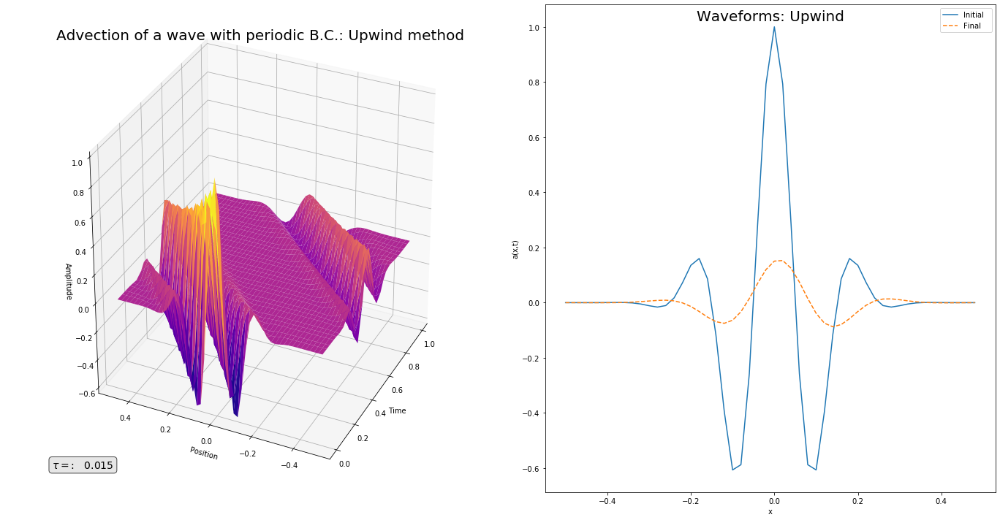

Wave circles system in  50.0  steps
Enter number of steps: 50


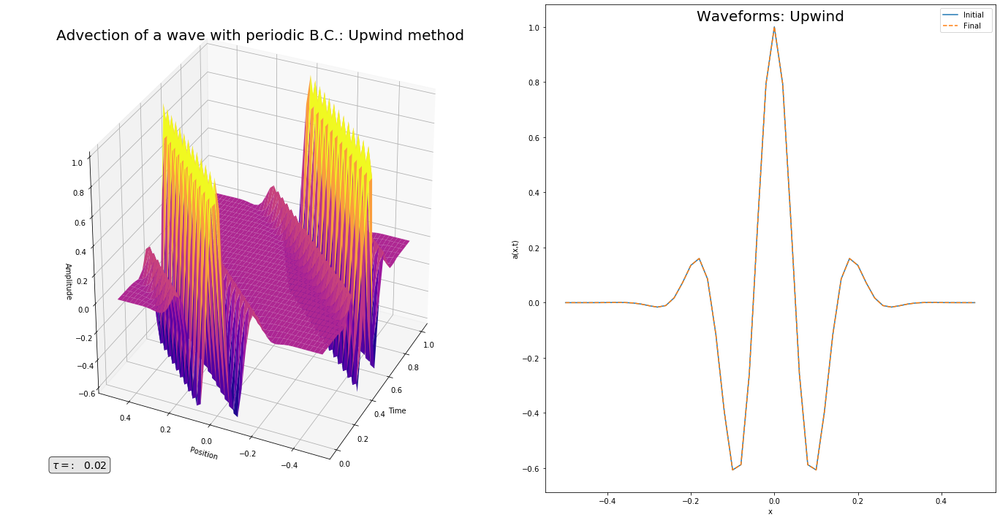

Wave circles system in  33.333333333333336  steps
Enter number of steps: 34


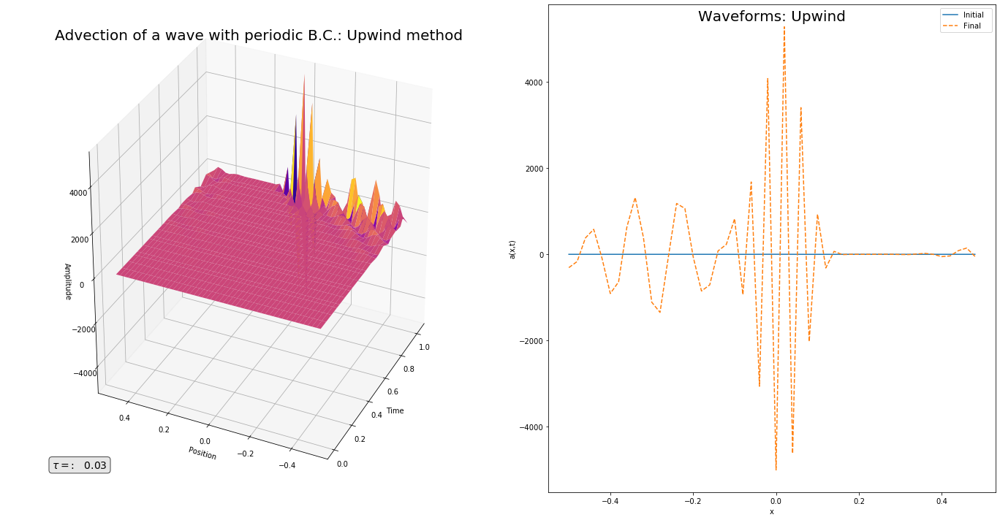

In [117]:
N = 50
tau_lst = np.array([.015, .02, .03])

L = 1.      # System size
h = L/N     # Grid spacing
c = 1.      # Wave speed
print('Time for wave to move one grid spacing is ', h/c)

# Set initial and boundary conditions: Dirichlet
sigma = 0.1                  # Width of the Gaussian pulse
k_wave = np.pi/sigma         # Wave number of the cosine
x = np.arange(N)*h - L/2.    # Coordinates of grid points

# Use periodic boundary conditions
ip = np.arange(N) + 1  
ip[N-1] = 0          # ip = i+1 with periodic b.c.
im = np.arange(N) - 1  
im[0] = N-1          # im = i-1 with periodic b.c.

for tau in tau_lst:
    coeff = c*tau/h
    print('Wave circles system in ', L/(c*tau), ' steps')
    nStep = int(input('Enter number of steps: '))
    
    # Initial condition is modulated Gaussian
    a = np.empty(N)
    for i in range(N) :
        a[i] = np.cos(k_wave*x[i]) * np.exp(-x[i]**2/(2*sigma**2)) 
    
    #* Initialize plotting variables.
    iplot = 1           # Plot counter
    nplots = 50         # Desired number of plots
    aplot = np.empty((N,nplots))
    tplot = np.empty(nplots)
    aplot[:,0] = np.copy(a)     # Record the initial state
    tplot[0] = 0                # Record the initial time (t=0)
    plotStep = nStep/nplots +1  # Number of steps between plots
    
    ## MAIN LOOP ##
    for iStep in range(nStep):  
        ### Upwind method ###
        a[:] = a[:] - coeff*( a[:] - a[im] )

        # Periodically record a(t) for plotting.
        if (iStep+1) % plotStep < 1 :        # Every plot_iter steps record 
            aplot[:,iplot] = np.copy(a)
            tplot[iplot] = tau*(iStep+1)
            iplot += 1

    Tp, Xp = np.meshgrid(tplot[0:iplot], x)

    ### Upwind Plot ###
    fig = plt.figure(figsize=(20,10))
    ax = fig.add_subplot(1, 2, 1, projection='3d')

    surf = ax.plot_surface(Tp, Xp, aplot[:,0:iplot], rstride=1, cstride=1, 
                           cmap=cmp)
    ax.set_xlabel('Time')
    ax.set_ylabel('Position')
    ax.set_zlabel('Amplitude')
    ax.set_title('Advection of a wave with periodic B.C.: Upwind method', fontsize = 20)
    ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
            fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
    ax.view_init(30, 205)

    ax = fig.add_subplot(1, 2, 2)
    ax.plot(x,aplot[:,0],'-',x,a,'--');
    plt.legend(['Initial  ','Final'])
    ax.set_title('Waveforms: Upwind', fontsize = 20, y = .959)
    ax.set_xlabel('x')
    ax.set_ylabel('a(x,t)')
    plt.tight_layout()
    plt.show()

Time for wave to move one grid spacing is  0.002
Wave circles system in  666.6666666666666  steps
Enter number of steps: 667


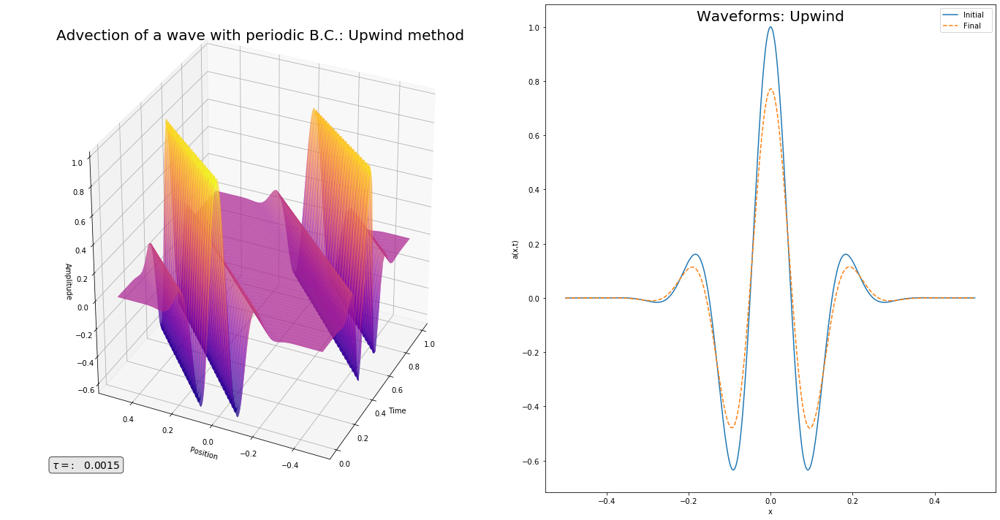

Wave circles system in  500.0  steps
Enter number of steps: 500


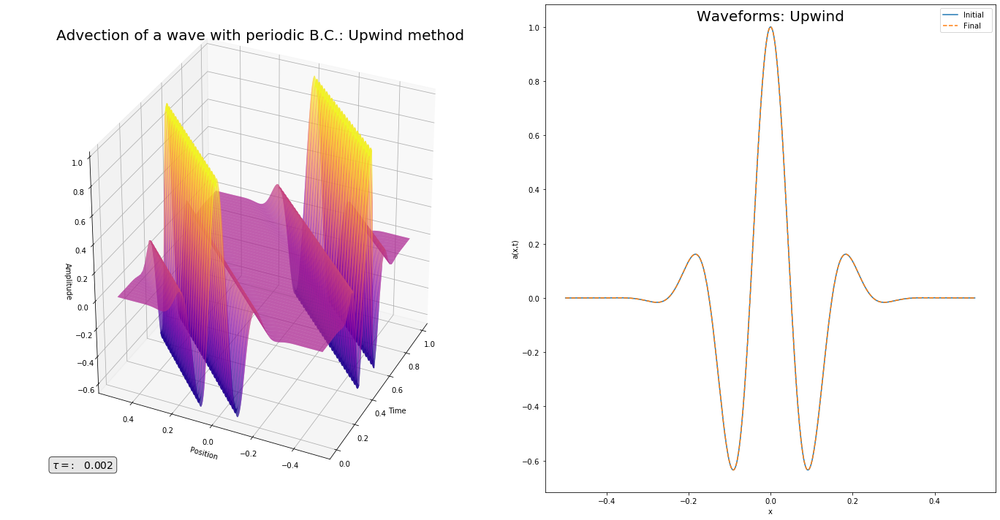

Wave circles system in  333.3333333333333  steps
Enter number of steps: 334


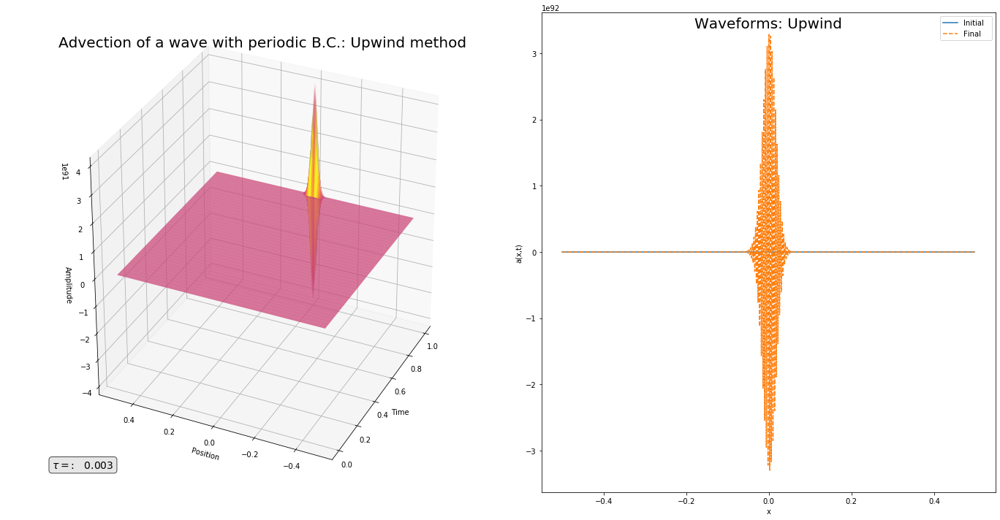

In [118]:
N = 500
tau_lst = np.array([.0015, .002, .003])

L = 1.      # System size
h = L/N     # Grid spacing
c = 1.      # Wave speed
print('Time for wave to move one grid spacing is ', h/c)

# Set initial and boundary conditions: Dirichlet
sigma = 0.1                  # Width of the Gaussian pulse
k_wave = np.pi/sigma         # Wave number of the cosine
x = np.arange(N)*h - L/2.    # Coordinates of grid points

# Use periodic boundary conditions
ip = np.arange(N) + 1  
ip[N-1] = 0          # ip = i+1 with periodic b.c.
im = np.arange(N) - 1  
im[0] = N-1          # im = i-1 with periodic b.c.

for tau in tau_lst:
    coeff = c*tau/h
    print('Wave circles system in ', L/(c*tau), ' steps')
    nStep = int(input('Enter number of steps: '))
    
    # Initial condition is modulated Gaussian
    a = np.empty(N)
    for i in range(N) :
        a[i] = np.cos(k_wave*x[i]) * np.exp(-x[i]**2/(2*sigma**2)) 
    
    #* Initialize plotting variables.
    iplot = 1           # Plot counter
    nplots = 50         # Desired number of plots
    aplot = np.empty((N,nplots))
    tplot = np.empty(nplots)
    aplot[:,0] = np.copy(a)     # Record the initial state
    tplot[0] = 0                # Record the initial time (t=0)
    plotStep = nStep/nplots +1  # Number of steps between plots
    
    ## MAIN LOOP ##
    for iStep in range(nStep):  
        ### Upwind method ###
        a[:] = a[:] - coeff*( a[:] - a[im] )

        # Periodically record a(t) for plotting.
        if (iStep+1) % plotStep < 1 :        # Every plot_iter steps record 
            aplot[:,iplot] = np.copy(a)
            tplot[iplot] = tau*(iStep+1)
            iplot += 1

    Tp, Xp = np.meshgrid(tplot[0:iplot], x)

    ### Upwind Plot ###
    fig = plt.figure(figsize=(20,10))
    ax = fig.add_subplot(1, 2, 1, projection='3d')

    surf = ax.plot_surface(Tp, Xp, aplot[:,0:iplot], rstride=1, cstride=1, 
                           cmap=cmp)
    ax.set_xlabel('Time')
    ax.set_ylabel('Position')
    ax.set_zlabel('Amplitude')
    ax.set_title('Advection of a wave with periodic B.C.: Upwind method', fontsize = 20)
    ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
            fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
    ax.view_init(30, 205)

    ax = fig.add_subplot(1, 2, 2)
    ax.plot(x,aplot[:,0],'-',x,a,'--');
    plt.legend(['Initial  ','Final'])
    ax.set_title('Waveforms: Upwind', fontsize = 20, y = .959)
    ax.set_xlabel('x')
    ax.set_ylabel('a(x,t)')
    plt.tight_layout()
    plt.show()

# Problem 2: 7.4
## 'Upwind' scheme
### Periodic B.C.s $\qquad \tau = {.015, .02, .03} \qquad N=50$

Time for wave to move one grid spacing is  0.02
Wave circles system in  66.66666666666667  steps
Enter number of steps: 67


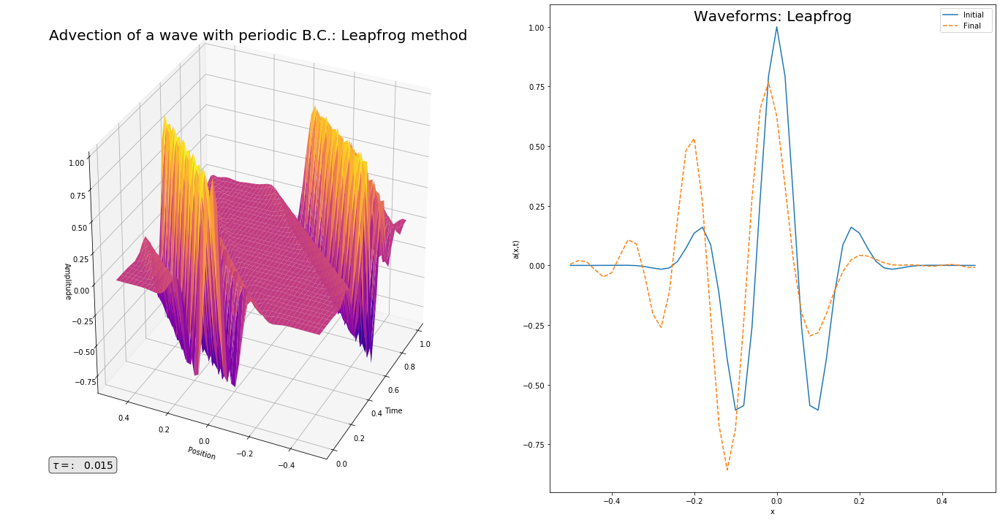

Wave circles system in  50.0  steps
Enter number of steps: 50


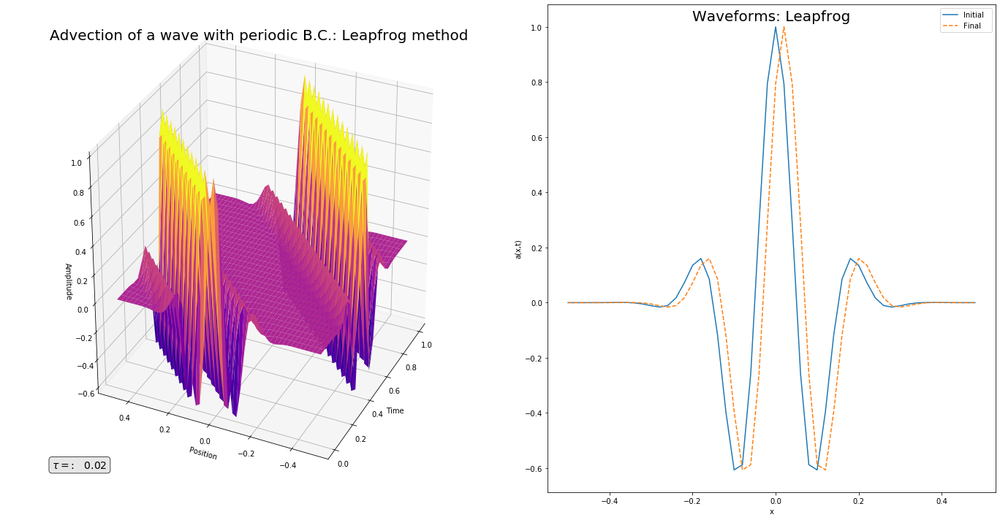

Wave circles system in  33.333333333333336  steps
Enter number of steps: 34


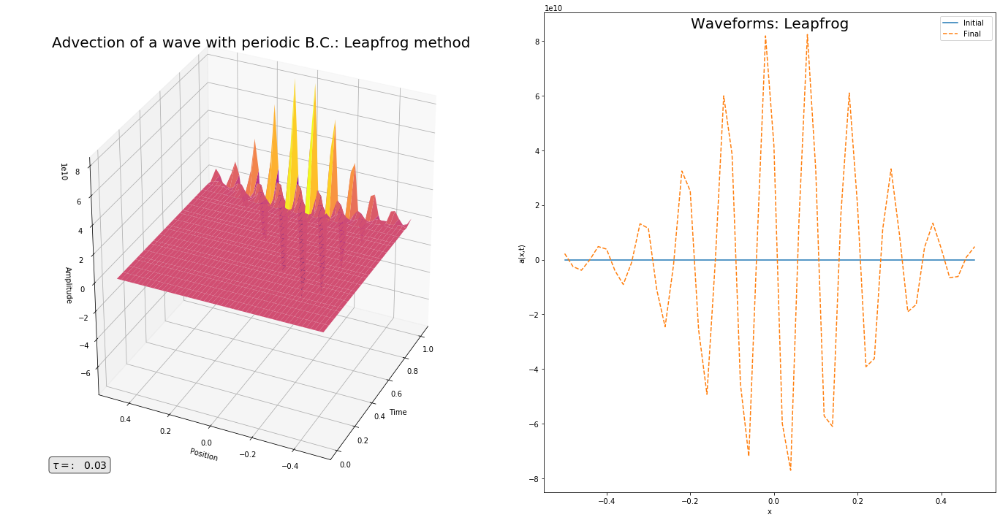

In [119]:
N = 50
tau_lst = np.array([.015, .02, .03])

L = 1.      # System size
h = L/N     # Grid spacing
c = 1.      # Wave speed
print('Time for wave to move one grid spacing is ', h/c)

# Set initial and boundary conditions: Dirichlet
sigma = 0.1                  # Width of the Gaussian pulse
k_wave = np.pi/sigma         # Wave number of the cosine
x = np.arange(N)*h - L/2.    # Coordinates of grid points

# Use periodic boundary conditions
ip = np.arange(N) + 1  
ip[N-1] = 0          # ip = i+1 with periodic b.c.
im = np.arange(N) - 1  
im[0] = N-1          # im = i-1 with periodic b.c.

for tau in tau_lst:
    coeff = c*tau/(2.*h)   
    coefflw = 2*coeff**2         
    print('Wave circles system in ', L/(c*tau), ' steps')
    nStep = int(input('Enter number of steps: '))
    
    # Initial condition is modulated Gaussian
    a = np.empty([N,3])
    for i in range(N) :
        a[i,0] = np.cos(k_wave*x[i]) * np.exp(-x[i]**2/(2*sigma**2))
    
    # First step using Lax-Wendroff
    a[:,1] = ( a[:,0] - coeff*( a[ip,0] - a[im,0] ) + 
                coefflw*( a[ip,0] + a[im,0] -2*a[:,0] ) )

    
    #* Initialize plotting variables.
    iplot = 1           # Plot counter
    nplots = 50         # Desired number of plots
    aplot = np.empty((N,nplots))
    tplot = np.empty(nplots)
    aplot[:,0] = np.copy(a[:,0])     # Record the initial state
    tplot[0] = 0                # Record the initial time (t=0)
    plotStep = nStep/nplots +1  # Number of steps between plots
    
    ## MAIN LOOP ##
    for iStep in range(nStep):  
        ### Leap-frog method ###
        a[:,2] = a[:,0] - 2*coeff*( a[ip,1] - a[im,1] )
        a[:,0] = a[:,1]
        a[:,1] = a[:,2]
        
        # Periodically record a(t) for plotting.
        if (iStep+1) % plotStep < 1 :        # Every plot_iter steps record 
            aplot[:,iplot] = np.copy(a[:,2])
            tplot[iplot] = tau*(iStep+1)
            iplot += 1

    Tp, Xp = np.meshgrid(tplot[0:iplot], x)

    ### Leap-frog Plot ###
    fig = plt.figure(figsize=(20,10))
    ax = fig.add_subplot(1, 2, 1, projection='3d')

    surf = ax.plot_surface(Tp, Xp, aplot[:,0:iplot], rstride=1, cstride=1, 
                           cmap=cmp)
    ax.set_xlabel('Time')
    ax.set_ylabel('Position')
    ax.set_zlabel('Amplitude')
    ax.set_title('Advection of a wave with periodic B.C.: Leapfrog method', fontsize = 20)
    ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
            fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
    ax.view_init(30, 205)

    ax = fig.add_subplot(1, 2, 2)
    ax.plot(x,aplot[:,0],'-',x,a[:,2],'--');
    plt.legend(['Initial  ','Final'])
    ax.set_title('Waveforms: Leapfrog', fontsize = 20, y = .959)
    ax.set_xlabel('x')
    ax.set_ylabel('a(x,t)')
    plt.tight_layout()
    plt.show()

Time for wave to move one grid spacing is  0.002
Wave circles system in  666.6666666666666  steps
Enter number of steps: 667


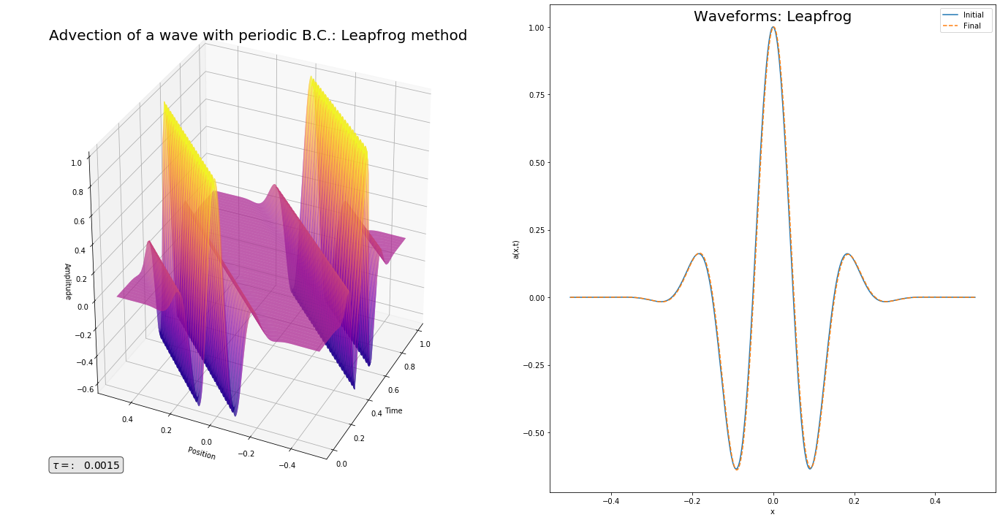

Wave circles system in  500.0  steps
Enter number of steps: 500


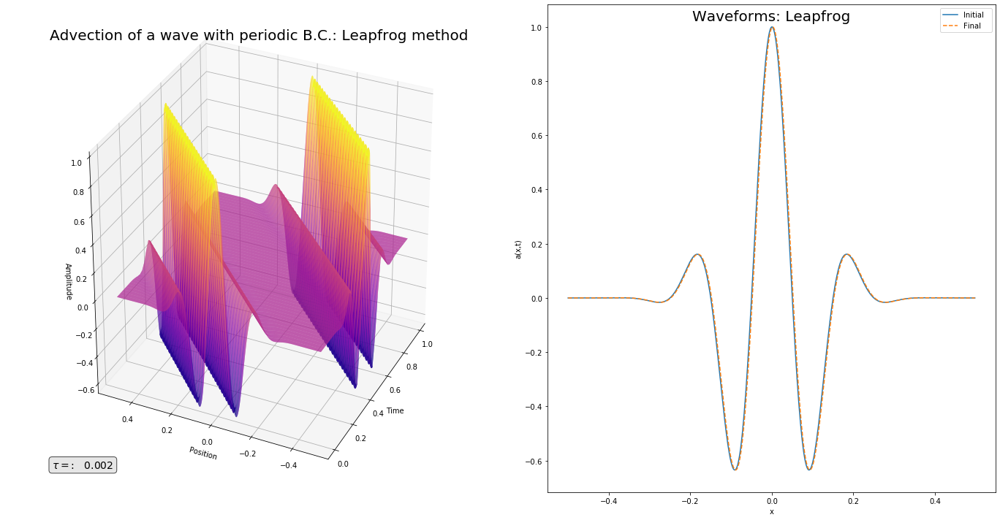

Wave circles system in  333.3333333333333  steps
Enter number of steps: 334


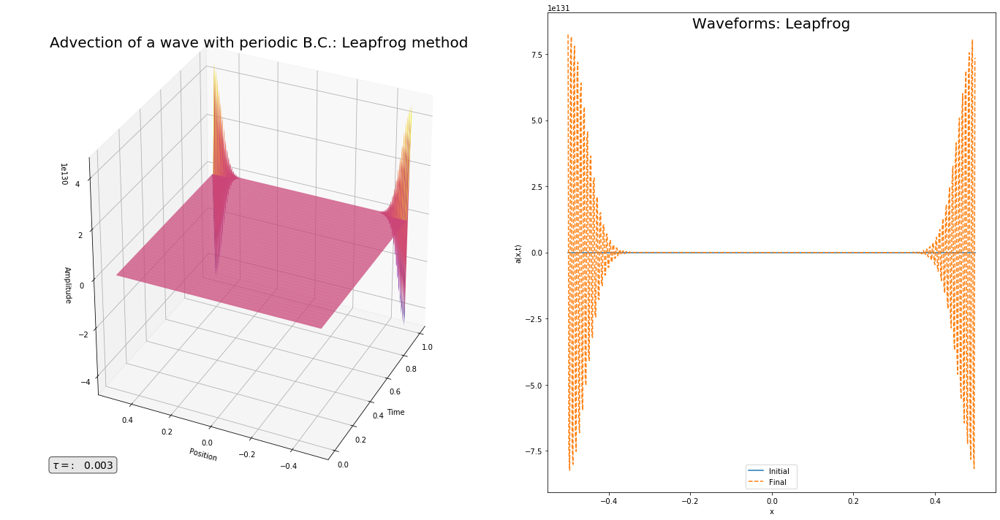

In [120]:
N = 500
tau_lst = np.array([.0015, .002, .003])

L = 1.      # System size
h = L/N     # Grid spacing
c = 1.      # Wave speed
print('Time for wave to move one grid spacing is ', h/c)

# Set initial and boundary conditions: Dirichlet
sigma = 0.1                  # Width of the Gaussian pulse
k_wave = np.pi/sigma         # Wave number of the cosine
x = np.arange(N)*h - L/2.    # Coordinates of grid points

# Use periodic boundary conditions
ip = np.arange(N) + 1  
ip[N-1] = 0          # ip = i+1 with periodic b.c.
im = np.arange(N) - 1  
im[0] = N-1          # im = i-1 with periodic b.c.

for tau in tau_lst:
    coeff = c*tau/(2.*h)   
    coefflw = 2*coeff**2         
    print('Wave circles system in ', L/(c*tau), ' steps')
    nStep = int(input('Enter number of steps: '))
    
    # Initial condition is modulated Gaussian
    a = np.empty([N,3])
    for i in range(N) :
        a[i,0] = np.cos(k_wave*x[i]) * np.exp(-x[i]**2/(2*sigma**2))
    
    # First step using Lax-Wendroff
    a[:,1] = ( a[:,0] - coeff*( a[ip,0] - a[im,0] ) + 
                coefflw*( a[ip,0] + a[im,0] -2*a[:,0] ) )

    
    #* Initialize plotting variables.
    iplot = 1           # Plot counter
    nplots = 50         # Desired number of plots
    aplot = np.empty((N,nplots))
    tplot = np.empty(nplots)
    aplot[:,0] = np.copy(a[:,0])     # Record the initial state
    tplot[0] = 0                # Record the initial time (t=0)
    plotStep = nStep/nplots +1  # Number of steps between plots
    
    ## MAIN LOOP ##
    for iStep in range(nStep):  
        ### Leap-frog method ###
        a[:,2] = a[:,0] - 2*coeff*( a[ip,1] - a[im,1] )
        a[:,0] = a[:,1]
        a[:,1] = a[:,2]
        
        # Periodically record a(t) for plotting.
        if (iStep+1) % plotStep < 1 :        # Every plot_iter steps record 
            aplot[:,iplot] = np.copy(a[:,2])
            tplot[iplot] = tau*(iStep+1)
            iplot += 1

    Tp, Xp = np.meshgrid(tplot[0:iplot], x)

    ### Leap-frog Plot ###
    fig = plt.figure(figsize=(20,10))
    ax = fig.add_subplot(1, 2, 1, projection='3d')

    surf = ax.plot_surface(Tp, Xp, aplot[:,0:iplot], rstride=1, cstride=1, 
                           cmap=cmp)
    ax.set_xlabel('Time')
    ax.set_ylabel('Position')
    ax.set_zlabel('Amplitude')
    ax.set_title('Advection of a wave with periodic B.C.: Leapfrog method', fontsize = 20)
    ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
            fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
    ax.view_init(30, 205)

    ax = fig.add_subplot(1, 2, 2)
    ax.plot(x,aplot[:,0],'-',x,a[:,2],'--');
    plt.legend(['Initial  ','Final'])
    ax.set_title('Waveforms: Leapfrog', fontsize = 20, y = .959)
    ax.set_xlabel('x')
    ax.set_ylabel('a(x,t)')
    plt.tight_layout()
    plt.show()

Time for wave to move one grid spacing is  0.001
Wave circles system in  1000.0  steps
Enter number of steps: 1000


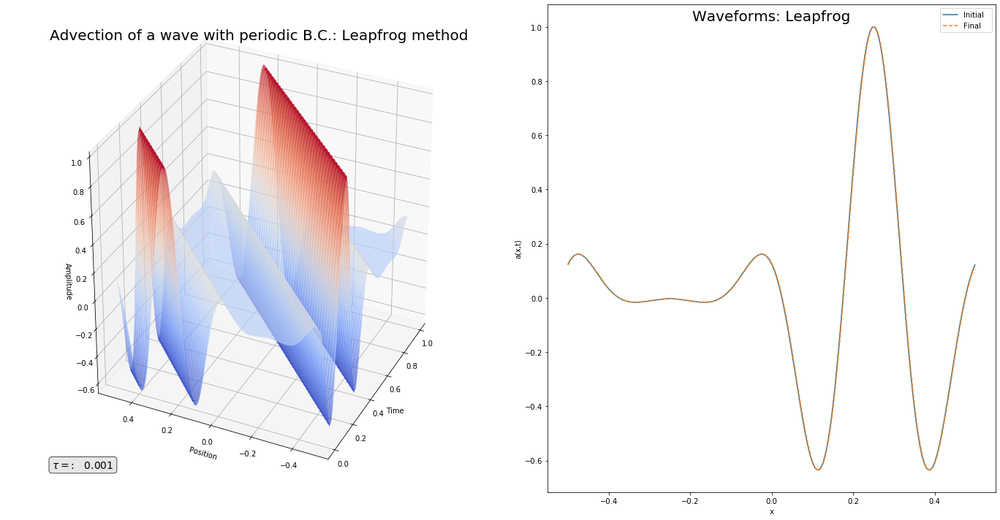

In [101]:
N = 1000
tau_lst = np.array([.001])

L = 1.      # System size
h = L/N     # Grid spacing
c = 1.      # Wave speed
print('Time for wave to move one grid spacing is ', h/c)

# Set initial and boundary conditions: Dirichlet
sigma = 0.15                  # Width of the Gaussian pulse
x0 = int(N/4)                # Offset
k_wave = np.pi/sigma         # Wave number of the cosine
x = np.arange(N)*h - L/2.    # Coordinates of grid points

# Use periodic boundary conditions
ip = np.arange(N) + 1  
ip[N-1] = 0          # ip = i+1 with periodic b.c.
im = np.arange(N) - 1  
im[0] = N-1          # im = i-1 with periodic b.c.
ioff = np.arange(N)
ioff = np.concatenate([ioff[x0:len(ioff)], ioff[0:x0]])

for tau in tau_lst:
    coeff = c*tau/(2.*h)   
    coefflw = 2*coeff**2         
    print('Wave circles system in ', L/(c*tau), ' steps')
    nStep = int(input('Enter number of steps: '))
    
    # Initial condition is modulated Gaussian
    a = np.empty([N,3])
    #for i in range(N) :
    a[ioff,0] = np.cos(k_wave*(x[:])) * np.exp(-(x[:])**2/(2*sigma**2))
    
    # First step using Lax-Wendroff
    a[:,1] = ( a[:,0] - coeff*( a[ip,0] - a[im,0] ) + 
                coefflw*( a[ip,0] + a[im,0] -2*a[:,0] ) )

    
    #* Initialize plotting variables.
    iplot = 1           # Plot counter
    nplots = 50         # Desired number of plots
    aplot = np.empty((N,nplots))
    tplot = np.empty(nplots)
    aplot[:,0] = np.copy(a[:,0])     # Record the initial state
    tplot[0] = 0                # Record the initial time (t=0)
    plotStep = nStep/nplots +1  # Number of steps between plots
    
    ## MAIN LOOP ##
    for iStep in range(nStep):  
        ### Leap-frog method ###
        a[:,2] = a[:,0] - 2*coeff*( a[ip,1] - a[im,1] )
        a[:,0] = a[:,1]
        a[:,1] = a[:,2]
        
        # Periodically record a(t) for plotting.
        if (iStep+1) % plotStep < 1 :        # Every plot_iter steps record 
            aplot[:,iplot] = np.copy(a[:,2])
            tplot[iplot] = tau*(iStep+1)
            iplot += 1

    Tp, Xp = np.meshgrid(tplot[0:iplot], x)

    ### Leap-frog Plot ###
    fig = plt.figure(figsize=(20,10))
    ax = fig.add_subplot(1, 2, 1, projection='3d')

    surf = ax.plot_surface(Tp, Xp, aplot[:,0:iplot], rstride=1, cstride=1, 
                           cmap='coolwarm')
    ax.set_xlabel('Time')
    ax.set_ylabel('Position')
    ax.set_zlabel('Amplitude')
    ax.set_title('Advection of a wave with periodic B.C.: Leapfrog method', fontsize = 20)
    ax.annotate('$\\tau=$:   %.6g'%(tau), xy = (.052, .1), xycoords = 'figure fraction', 
            fontsize = 14, bbox=dict(boxstyle="round", alpha = .7, fc="gainsboro"))
    ax.view_init(30, 205)

    ax = fig.add_subplot(1, 2, 2)
    ax.plot(x,aplot[:,0],'-',x,a[:,2],'--');
    plt.legend(['Initial  ','Final'])
    ax.set_title('Waveforms: Leapfrog', fontsize = 20, y = .959)
    ax.set_xlabel('x')
    ax.set_ylabel('a(x,t)')
    plt.tight_layout()
    plt.show()

In [2]:
N = 10
ip = np.arange(N) + 1  
ip[N-1] = 0
print(ip)

[1 2 3 4 5 6 7 8 9 0]
